In [1]:
import pandas as pd
import pylab as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from sklearn.preprocessing import PolynomialFeatures
import scipy.stats
import patsy as pt
import statsmodels.stats.outliers_influence as smo

# Analiza wstępna

In [196]:
df_base = pd.read_csv("data/yt_analytics.csv")

In [197]:
df_base.head()

,ID,Video Duration,Video Publish Time,Days Since Publish,Day,Month,Year,Day of Week,Revenue per 1000 Views (USD),Monetized Playbacks (Estimate),...,Watched (Not Skipped) (%),Feed Impressions,Average View Percentage (%),Average View Duration,Views,Watch Time (hours),Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
0,0,201.0,2016-06-02 00:00:00,0,2,6,2016,Thursday,0.024,723.0,...,0.0,0.0,40.38,81.0,23531.0,533.1636,51.0,0.561,41118.0,27.66
1,1,391.0,2016-06-10 00:00:00,8,10,6,2016,Friday,0.056,727.0,...,0.0,0.0,39.85,156.0,11478.0,500.5628,33.0,0.648,41627.0,5.85
2,2,133.0,2016-06-14 00:00:00,4,14,6,2016,Tuesday,0.014,76.0,...,0.0,0.0,30.88,41.0,6153.0,70.7287,8.0,0.089,38713.0,7.07
3,3,14.0,2016-06-29 00:00:00,15,29,6,2016,Wednesday,0.004,18.0,...,0.0,0.0,103.05,14.0,4398.0,17.6251,2.0,0.017,35245.0,5.60
4,4,45.0,2016-07-01 00:00:00,2,1,7,2016,Friday,0.000,0.0,...,0.0,0.0,55.70,25.0,14659.0,104.3341,28.0,0.000,46218.0,8.62


In [5]:
df_base['Video Publish Time'] = pd.to_datetime(df_base['Video Publish Time'])

In [6]:
df_base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364 entries, 0 to 363
Data columns (total 70 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   ID                                  364 non-null    int64         
 1   Video Duration                      364 non-null    float64       
 2   Video Publish Time                  364 non-null    datetime64[ns]
 3   Days Since Publish                  364 non-null    int64         
 4   Day                                 364 non-null    int64         
 5   Month                               364 non-null    int64         
 6   Year                                364 non-null    int64         
 7   Day of Week                         364 non-null    object        
 8   Revenue per 1000 Views (USD)        364 non-null    float64       
 9   Monetized Playbacks (Estimate)      364 non-null    float64       
 10  Playback-Based CPM (USD)  

In [7]:
df_base["Views"]

0      23531.0
1      11478.0
2       6153.0
3       4398.0
4      14659.0
        ...   
359    10018.0
360     8298.0
361     8487.0
362     7060.0
363     3890.0
Name: Views, Length: 364, dtype: float64

In [8]:
df_base["Views"].median()

101950.5

In [9]:
df_base.describe()

,ID,Video Duration,Video Publish Time,Days Since Publish,Day,Month,Year,Revenue per 1000 Views (USD),Monetized Playbacks (Estimate),Playback-Based CPM (USD),...,Watched (Not Skipped) (%),Feed Impressions,Average View Percentage (%),Average View Duration,Views,Watch Time (hours),Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
count,364.000000,364.000000,364,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,...,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,3.640000e+02,364.000000
mean,181.500000,664.239011,2019-03-31 17:52:05.274725376,8.406593,15.807692,6.642857,2018.736264,0.112283,8934.711538,1.553734,...,0.824176,0.008242,45.970989,285.612637,128800.101648,10058.965455,321.024725,8.852052,9.595286e+05,7.914615
min,0.000000,9.000000,2016-06-02 00:00:00,0.000000,1.000000,1.000000,2016.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,15.050000,8.000000,2461.000000,12.697900,-3.000000,0.000000,3.222800e+04,0.620000
25%,90.750000,496.000000,2017-06-02 12:00:00,3.000000,8.000000,4.000000,2017.000000,0.015000,349.500000,0.817750,...,0.000000,0.000000,40.252500,233.750000,27160.500000,2759.404250,41.000000,0.443250,1.317082e+05,6.420000
50%,181.500000,613.000000,2018-01-28 00:00:00,5.000000,16.000000,7.000000,2018.000000,0.050000,3564.000000,1.540500,...,0.000000,0.000000,45.465000,286.500000,101950.500000,8102.962950,180.000000,4.285000,6.204065e+05,8.395000
75%,272.250000,786.500000,2021-02-19 12:00:00,9.000000,23.000000,10.000000,2021.000000,0.143500,13579.250000,2.025250,...,0.000000,0.000000,51.010000,344.250000,198169.500000,14084.498550,421.250000,11.476250,1.368464e+06,9.920000
max,363.000000,2311.000000,2024-10-18 00:00:00,260.000000,31.000000,12.000000,2024.000000,1.600000,100566.000000,7.385000,...,100.000000,1.000000,117.300000,776.000000,670990.000000,53794.658700,3728.000000,103.117000,1.270226e+07,27.660000
std,105.221988,330.646183,NaN,15.371239,8.924004,3.421521,2.530629,0.179668,12967.843236,1.078549,...,9.053369,0.090534,12.457470,116.595678,118209.844270,9516.160361,444.594763,13.414650,1.180519e+06,2.903383


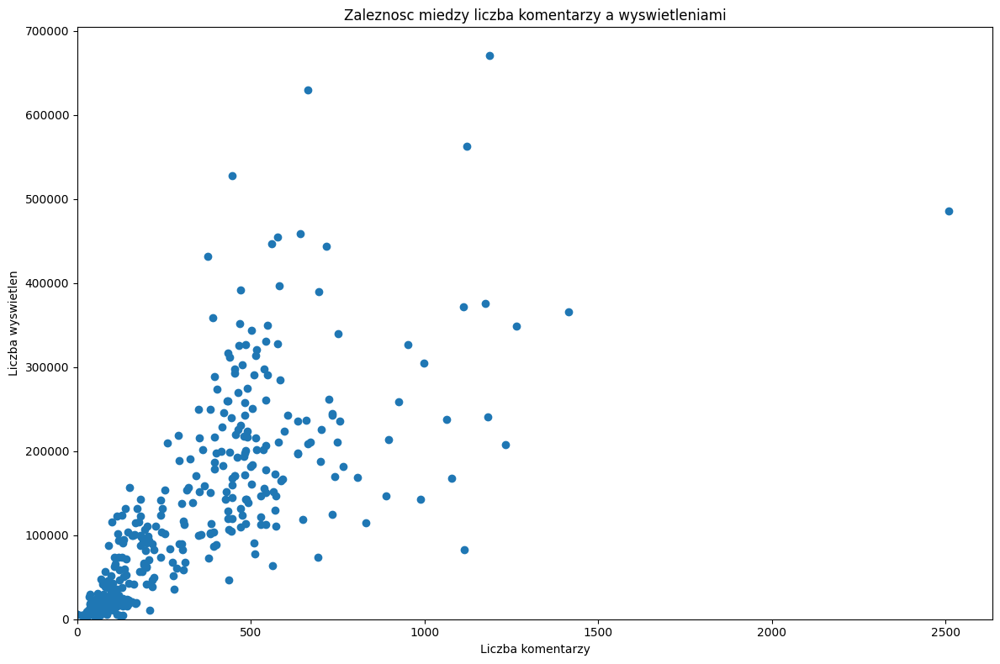

In [200]:
plt.plot(df_base["New Comments"], df_base["Views"], "o")
plt.title("Zaleznosc miedzy liczba komentarzy a wyswietleniami")
plt.xlabel("Liczba komentarzy")
plt.ylabel("Liczba wyswietlen")
plt.axis(xmin = 0, ymin = 0)
plt.tight_layout()
#plt.savefig('wykres.jpg')
plt.show()

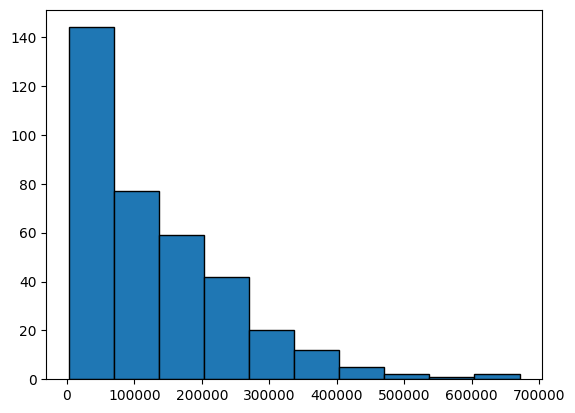

In [11]:
plt.hist(df_base["Views"], edgecolor = "black")
plt.show()

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\2320619009.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=views_by_day.index, y=views_by_day.values, palette='viridis')


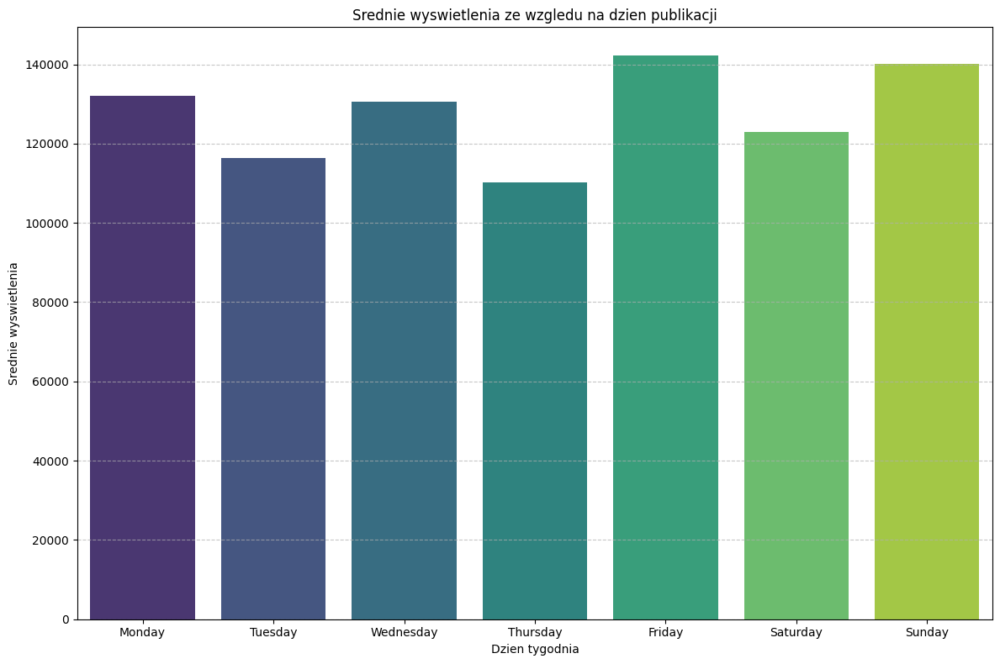

In [201]:
views_by_day = df_base.groupby('Day of Week')['Views'].mean().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)
sns.barplot(x=views_by_day.index, y=views_by_day.values, palette='viridis')
plt.title('Srednie wyswietlenia ze wzgledu na dzien publikacji')
plt.xlabel('Dzien tygodnia')
plt.ylabel('Srednie wyswietlenia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
#plt.savefig('wykres3.jpg')
plt.show()

In [13]:
missings = df_base.isna()
missings.sum()

ID                         0
Video Duration             0
Video Publish Time         0
Days Since Publish         0
Day                        0
                          ..
Watch Time (hours)         0
Subscribers                0
Estimated Revenue (USD)    0
Impressions                0
Video Thumbnail CTR (%)    0
Length: 70, dtype: int64

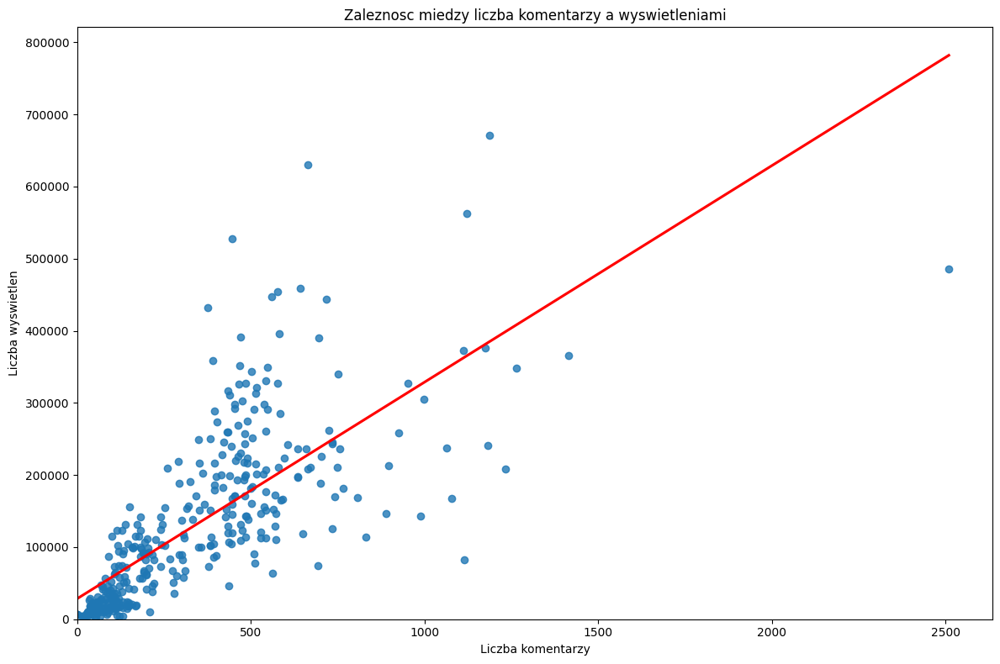

In [202]:
sns.regplot(y ="Views", x = "New Comments", data = df_base, ci = None, line_kws = dict(color = 'red'))
plt.title("Zaleznosc miedzy liczba komentarzy a wyswietleniami")
plt.xlabel("Liczba komentarzy")
plt.ylabel("Liczba wyswietlen")
plt.axis(xmin = 0, ymin = 0)
plt.tight_layout()
#plt.savefig('wykres.jpg')
plt.show()

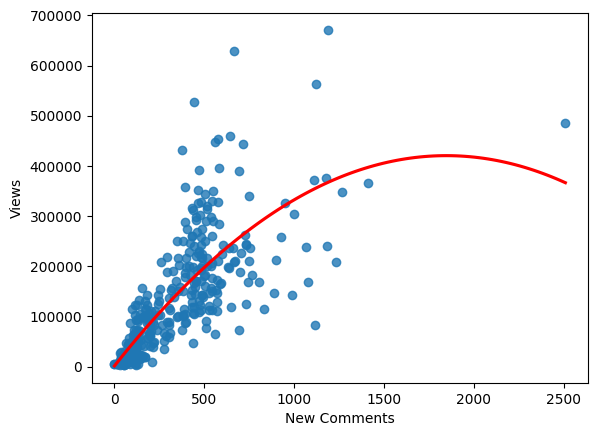

In [15]:
sns.regplot(y ="Views", x = "New Comments", data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)
plt.show()

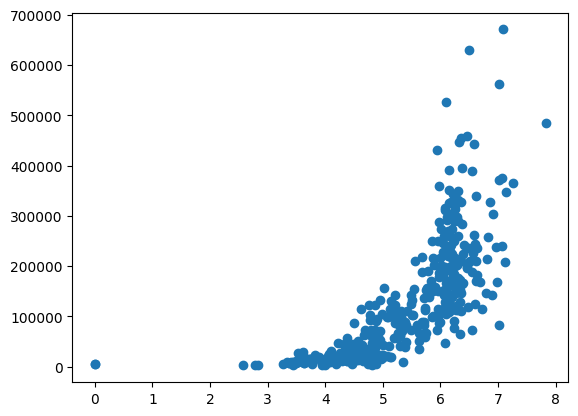

In [16]:
plt.plot(np.log(df_base["New Comments"]+1), df_base["Views"], 'o')
plt.show()

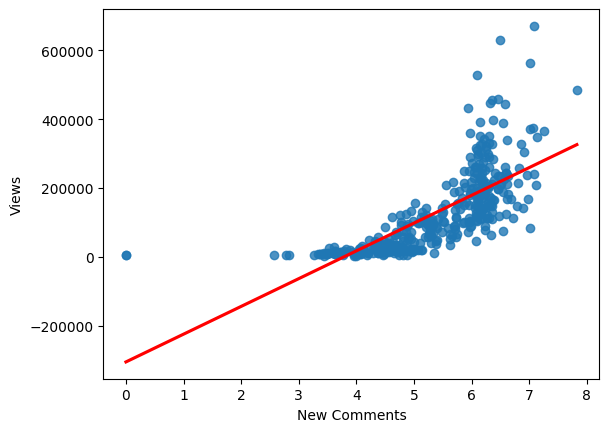

In [17]:
sns.regplot(y ="Views", x = np.log(df_base["New Comments"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'))
plt.show()

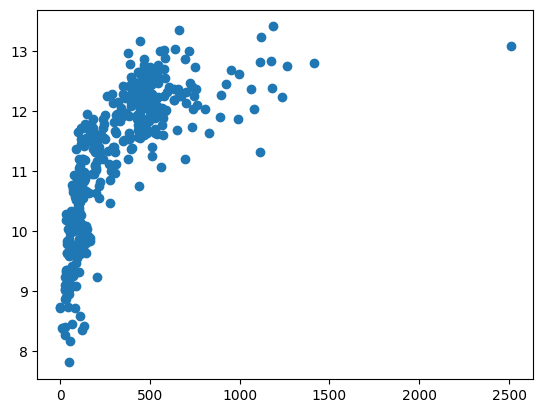

In [18]:
plt.plot(df_base["New Comments"], np.log(df_base["Views"]), 'o')
plt.show()

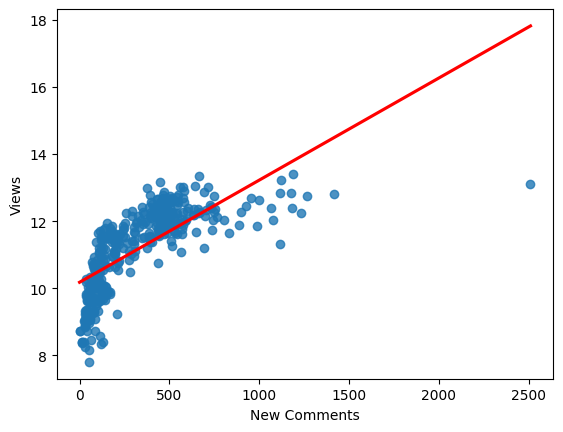

In [19]:
sns.regplot(y = np.log(df_base["Views"]), x = "New Comments", data = df_base, ci = None, line_kws = dict(color = 'red'))
plt.show()

G:\python\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


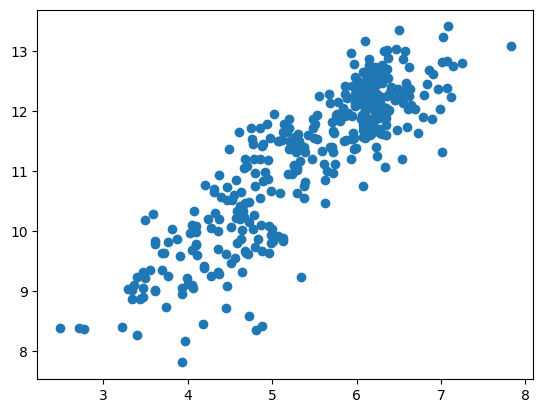

In [20]:
plt.plot(np.log(df_base["New Comments"]), np.log(df_base["Views"]), 'o')
plt.show()

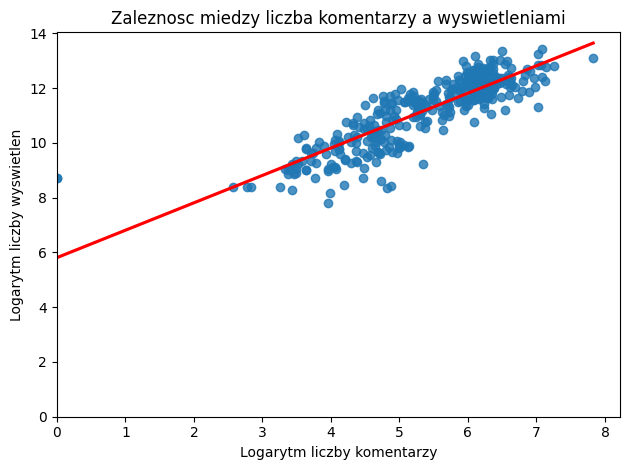

In [21]:
sns.regplot(y = np.log(df_base["Views"]), x = np.log(df_base["New Comments"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'))
plt.title("Zaleznosc miedzy liczba komentarzy a wyswietleniami")
plt.xlabel("Logarytm liczby komentarzy")
plt.ylabel("Logarytm liczby wyswietlen")
plt.axis(xmin = 0, ymin = 0)
plt.tight_layout()
#plt.savefig('wykres2.jpg')
plt.show()

In [22]:
print(df_base[df_base["New Comments"] < 10])


    ID  Video Duration Video Publish Time  Days Since Publish  Day  Month  \
2    2           133.0         2016-06-14                   4   14      6   
10  10            29.0         2016-08-17                   5   17      8   

    Year Day of Week  Revenue per 1000 Views (USD)  \
2   2016     Tuesday                         0.014   
10  2016   Wednesday                         0.037   

    Monetized Playbacks (Estimate)  ...  Watched (Not Skipped) (%)  \
2                             76.0  ...                        0.0   
10                           199.0  ...                        0.0   

    Feed Impressions  Average View Percentage (%)  Average View Duration  \
2                0.0                        30.88                   41.0   
10               0.0                        79.64                   23.0   

     Views  Watch Time (hours)  Subscribers  Estimated Revenue (USD)  \
2   6153.0             70.7287          8.0                    0.089   
10  6209.0           

In [23]:
print(df_base[df_base["Estimated Revenue (USD)"] == 0]["Estimated Revenue (USD)"])


4      0.0
11     0.0
61     0.0
93     0.0
145    0.0
173    0.0
178    0.0
182    0.0
192    0.0
193    0.0
200    0.0
203    0.0
208    0.0
232    0.0
235    0.0
241    0.0
246    0.0
247    0.0
250    0.0
253    0.0
254    0.0
268    0.0
274    0.0
287    0.0
291    0.0
292    0.0
307    0.0
331    0.0
338    0.0
340    0.0
Name: Estimated Revenue (USD), dtype: float64


In [24]:
print(df_base[(df_base["Estimated Revenue (USD)"] < 10) & (df_base["Estimated Revenue (USD)"] > 0)]["Estimated Revenue (USD)"])

0      0.561
1      0.648
2      0.089
3      0.017
5      0.305
       ...  
359    8.063
360    8.705
361    9.852
362    3.858
363    5.915
Name: Estimated Revenue (USD), Length: 232, dtype: float64


# Wybieranie zmiennych do modelu

In [25]:
selected_columns = [
    "Video Duration",
    "Video Publish Time",
    "Day of Week",
    "Ad Impressions",
    "YouTube Ads Revenue (USD)",
    "New Comments",
    "Shares",
    "Dislikes",
    "Likes",
    "Unsubscribes",
    "Playlist Watch Time (hours)",
    "Average View Duration",
    "Views",
    "New Subscribers",
    "Estimated Revenue (USD)",
    "Impressions",
    "Video Thumbnail CTR (%)"
]

In [26]:
df_base_filtered = df_base[selected_columns]

In [27]:
df_base_filtered

,Video Duration,Video Publish Time,Day of Week,Ad Impressions,YouTube Ads Revenue (USD),New Comments,Shares,Dislikes,Likes,Unsubscribes,Playlist Watch Time (hours),Average View Duration,Views,New Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85
2,133.0,2016-06-14,Tuesday,88.0,0.160,0.0,4.0,20.0,239.0,0.0,0.1683,41.0,6153.0,8.0,0.089,38713.0,7.07
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60
4,45.0,2016-07-01,Friday,0.0,0.000,50.0,7.0,180.0,602.0,3.0,0.0611,25.0,14659.0,31.0,0.000,46218.0,8.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29


In [28]:
df_base_filtered.describe()

,Video Duration,Video Publish Time,Ad Impressions,YouTube Ads Revenue (USD),New Comments,Shares,Dislikes,Likes,Unsubscribes,Playlist Watch Time (hours),Average View Duration,Views,New Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
count,364.000000,364,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,3.640000e+02,364.000000
mean,664.239011,2019-03-31 17:52:05.274725376,15117.953297,15.363964,333.846154,252.958791,123.961538,5526.733516,28.906593,24.830608,285.612637,128800.101648,349.931319,8.852052,9.595286e+05,7.914615
min,9.000000,2016-06-02 00:00:00,0.000000,0.000000,0.000000,1.000000,2.000000,121.000000,0.000000,0.000000,8.000000,2461.000000,0.000000,0.000000,3.222800e+04,0.620000
25%,496.000000,2017-06-02 12:00:00,368.500000,0.344500,104.750000,38.000000,27.000000,1205.500000,3.000000,0.409050,233.750000,27160.500000,44.500000,0.443250,1.317082e+05,6.420000
50%,613.000000,2018-01-28 00:00:00,5892.000000,7.527500,262.500000,149.000000,85.500000,5172.000000,20.000000,2.350500,286.500000,101950.500000,200.000000,4.285000,6.204065e+05,8.395000
75%,786.500000,2021-02-19 12:00:00,19372.000000,20.071750,485.000000,313.250000,179.250000,8504.750000,41.000000,39.475550,344.250000,198169.500000,464.000000,11.476250,1.368464e+06,9.920000
max,2311.000000,2024-10-18 00:00:00,141634.000000,182.796000,2510.000000,4190.000000,818.000000,27222.000000,713.000000,171.351500,776.000000,670990.000000,3925.000000,103.117000,1.270226e+07,27.660000
std,330.646183,NaN,24339.924215,23.614172,291.934648,363.016405,128.311620,4465.210998,48.591932,38.958396,116.595678,118209.844270,468.539050,13.414650,1.180519e+06,2.903383


In [29]:
df_num = df_base_filtered.select_dtypes(include = 'number')
df_num

,Video Duration,Ad Impressions,YouTube Ads Revenue (USD),New Comments,Shares,Dislikes,Likes,Unsubscribes,Playlist Watch Time (hours),Average View Duration,Views,New Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
0,201.0,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66
1,391.0,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85
2,133.0,88.0,0.160,0.0,4.0,20.0,239.0,0.0,0.1683,41.0,6153.0,8.0,0.089,38713.0,7.07
3,14.0,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60
4,45.0,0.0,0.000,50.0,7.0,180.0,602.0,3.0,0.0611,25.0,14659.0,31.0,0.000,46218.0,8.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23
360,818.0,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36
361,2233.0,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28
362,391.0,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29


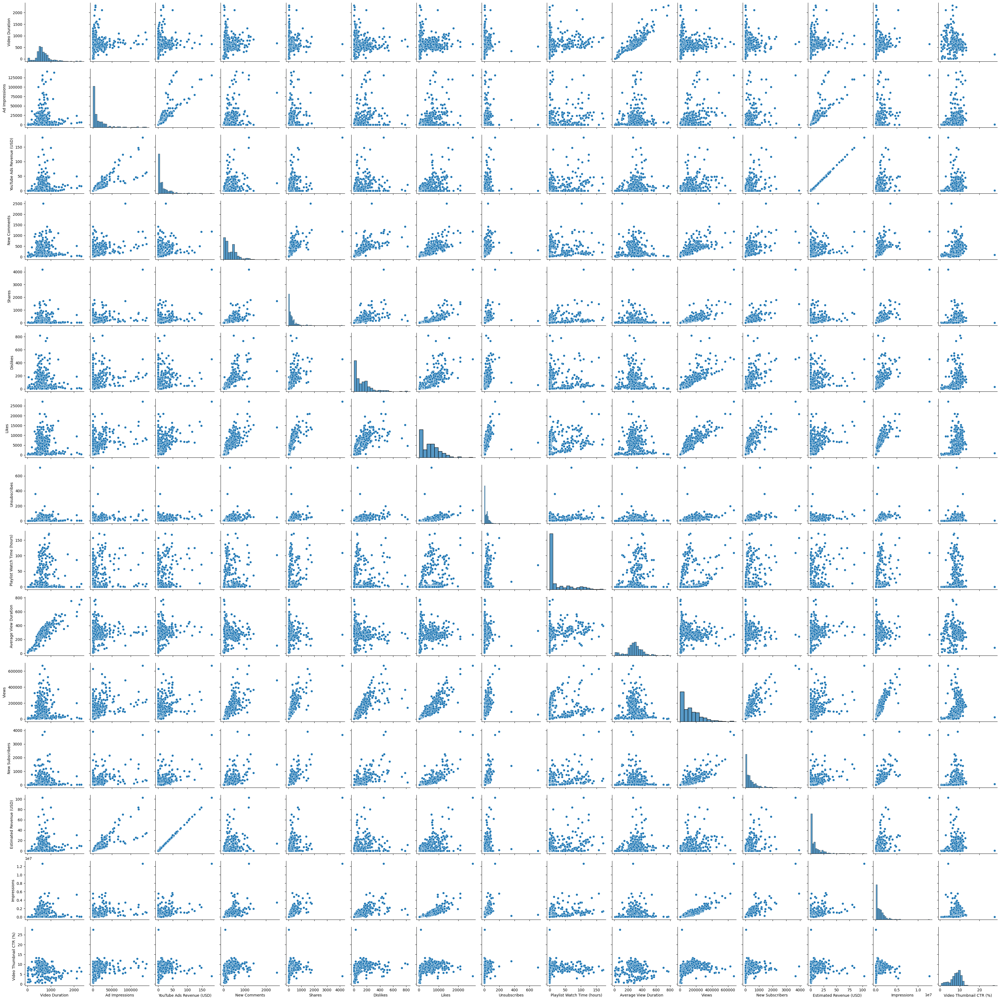

In [30]:
sns.pairplot(df_num)

In [31]:
df_num.corr(method = 'pearson')

,Video Duration,Ad Impressions,YouTube Ads Revenue (USD),New Comments,Shares,Dislikes,Likes,Unsubscribes,Playlist Watch Time (hours),Average View Duration,Views,New Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
Video Duration,1.000000,0.078067,0.129160,-0.013780,-0.026655,-0.068483,-0.031170,-0.037603,0.141590,0.881891,-0.051500,-0.028176,0.135767,0.039546,-0.190195
Ad Impressions,0.078067,1.000000,0.832923,0.303669,0.304564,0.202717,0.355741,0.075693,0.193350,0.098677,0.365138,0.312533,0.825534,0.331913,0.140365
YouTube Ads Revenue (USD),0.129160,0.832923,1.000000,0.202784,0.357679,0.145139,0.416689,0.149152,0.360618,0.197417,0.354127,0.408448,0.999471,0.461595,0.058882
New Comments,-0.013780,0.303669,0.202784,1.000000,0.664067,0.724499,0.757375,0.302743,0.091155,-0.075089,0.741259,0.579316,0.201677,0.584980,0.337628
Shares,-0.026655,0.304564,0.357679,0.664067,1.000000,0.562869,0.790347,0.358429,0.304046,-0.047610,0.772284,0.795568,0.362089,0.818294,0.189931
Dislikes,-0.068483,0.202717,0.145139,0.724499,0.562869,1.000000,0.690034,0.315642,0.001117,-0.129839,0.780940,0.605959,0.143814,0.608038,0.330017
Likes,-0.031170,0.355741,0.416689,0.757375,0.790347,0.690034,1.000000,0.486960,0.330958,0.049306,0.899124,0.795466,0.425544,0.843148,0.423302
Unsubscribes,-0.037603,0.075693,0.149152,0.302743,0.358429,0.315642,0.486960,1.000000,0.261624,0.022879,0.386644,0.532026,0.155485,0.411068,0.200776
Playlist Watch Time (hours),0.141590,0.193350,0.360618,0.091155,0.304046,0.001117,0.330958,0.261624,1.000000,0.258377,0.188268,0.368283,0.376459,0.320196,0.002077
Average View Duration,0.881891,0.098677,0.197417,-0.075089,-0.047610,-0.129839,0.049306,0.022879,0.258377,1.000000,-0.046536,-0.028335,0.207286,0.055428,-0.072398


<Axes: >

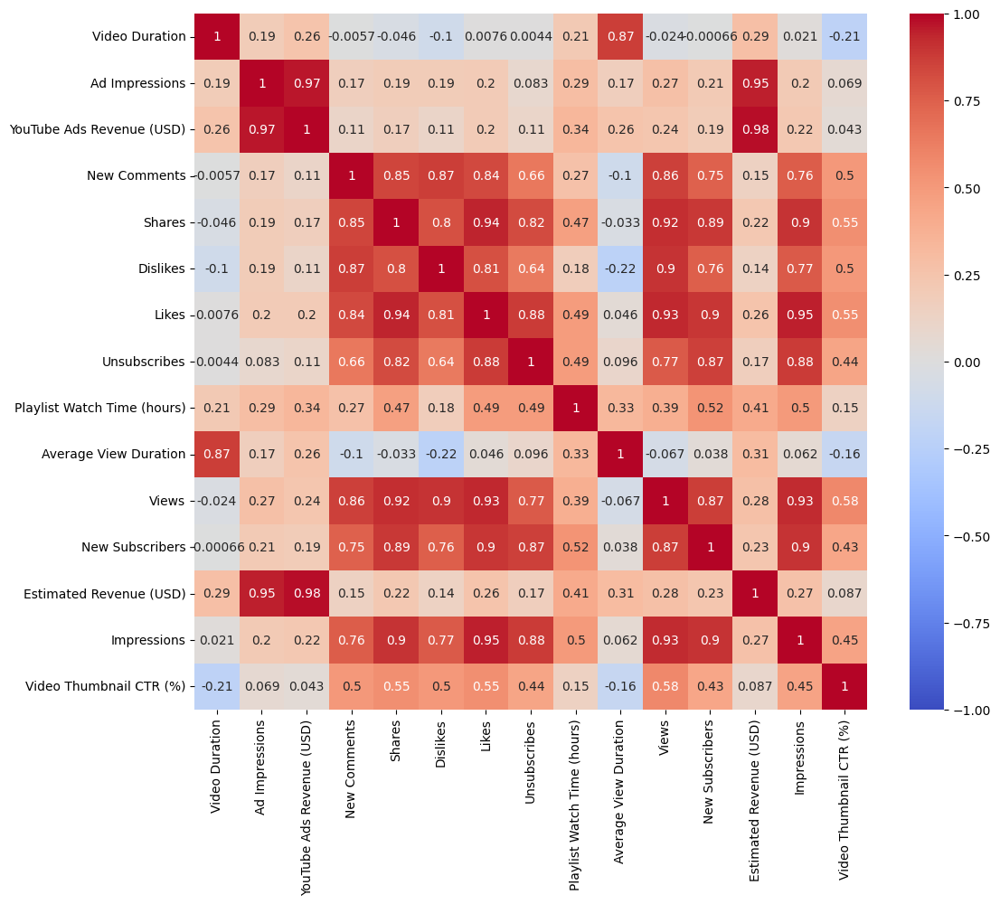

In [32]:
plt.figure(figsize=(12, 10))
sns.heatmap(df_num.corr(method = 'spearman'),vmin = -1, vmax = 1, annot = True, cmap = 'coolwarm') 

In [33]:
X = df_base[['Ad Impressions', 'New Comments', 'Shares', 'Likes', 'Dislikes', 
             'Subscribers', 'Playlist Watch Time (hours)', 'Video Thumbnail CTR (%)']]


vif_data = pd.DataFrame()
vif_data['Variable'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                      Variable        VIF
0               Ad Impressions   1.627556
1                 New Comments   7.229636
2                       Shares   5.533794
3                        Likes  14.438782
4                     Dislikes   5.243263
5                  Subscribers   5.877546
6  Playlist Watch Time (hours)   1.834413
7      Video Thumbnail CTR (%)   4.074127


In [34]:
X = df_base[['Ad Impressions', 'New Comments', 'Shares', 'Dislikes', 
             'Subscribers', 'Playlist Watch Time (hours)', 'Video Thumbnail CTR (%)']]


vif_data = pd.DataFrame()
vif_data['Variable'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                      Variable       VIF
0               Ad Impressions  1.617293
1                 New Comments  6.429642
2                       Shares  5.028662
3                     Dislikes  5.047609
4                  Subscribers  5.219606
5  Playlist Watch Time (hours)  1.729695
6      Video Thumbnail CTR (%)  3.121042


In [35]:
df_num_log = df_num.copy()

for col in df_num.columns:
    df_num_log[col] = np.log(df_num[col] + 1)

df_num_log.head()

,Video Duration,Ad Impressions,YouTube Ads Revenue (USD),New Comments,Shares,Dislikes,Likes,Unsubscribes,Playlist Watch Time (hours),Average View Duration,Views,New Subscribers,Estimated Revenue (USD),Impressions,Video Thumbnail CTR (%)
0,5.308268,6.889591,0.694147,4.521789,2.564949,3.433987,6.829794,1.386294,0.260362,4.406719,10.066116,4.007333,0.445327,10.624226,3.355502
1,5.971262,6.759255,0.775648,3.583519,1.791759,2.944439,5.777652,0.693147,0.417855,5.056246,9.348275,3.555348,0.499562,10.636528,1.924249
2,4.897840,4.488636,0.148420,0.000000,1.609438,3.044522,5.480639,0.000000,0.155550,3.737670,8.724858,2.197225,0.085260,10.563957,2.088153
3,2.708050,3.583519,0.029559,2.564949,2.079442,2.708050,5.398163,0.000000,0.062035,2.708050,8.389133,1.098612,0.016857,10.470107,1.887070
4,3.828641,0.000000,0.000000,3.931826,2.079442,5.198497,6.401917,1.386294,0.059306,3.258097,9.592878,3.465736,0.000000,10.741146,2.263844


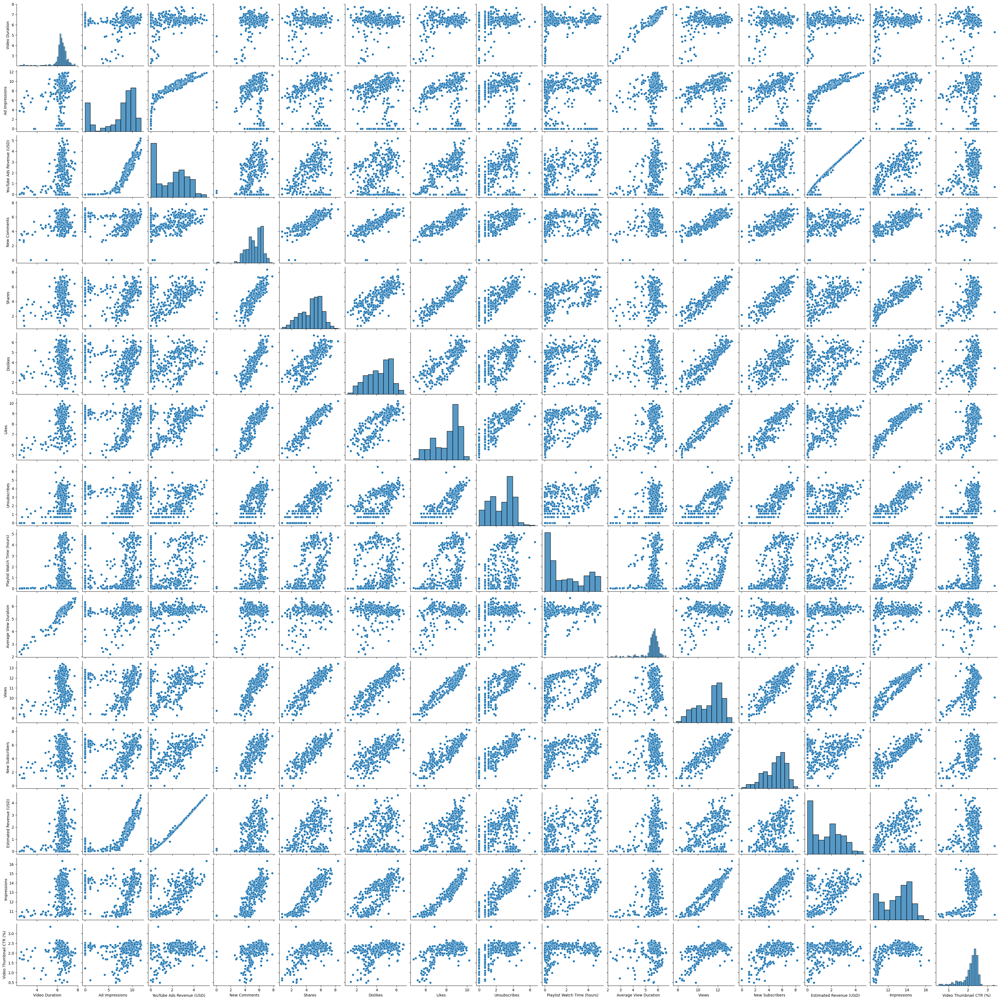

In [36]:
sns.pairplot(df_num_log)

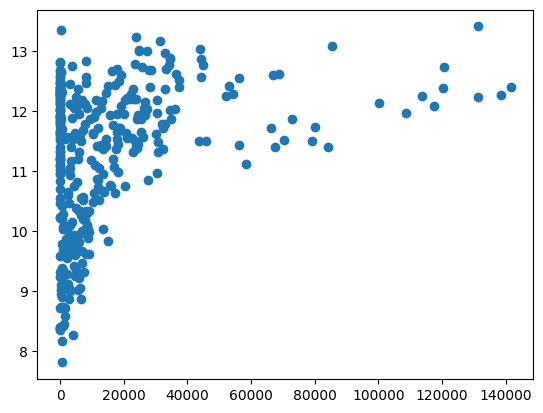

In [37]:
plt.plot(df_base["Ad Impressions"], np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Ad Impressions', ylabel='Views'>

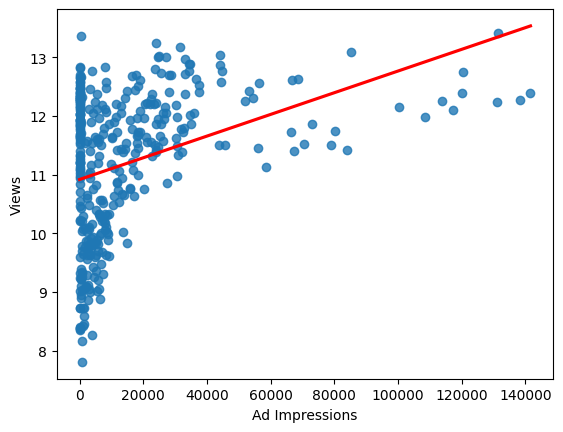

In [38]:
sns.regplot(y = np.log(df_base["Views"]), x = df_base["Ad Impressions"], data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Ad Impressions', ylabel='Views'>

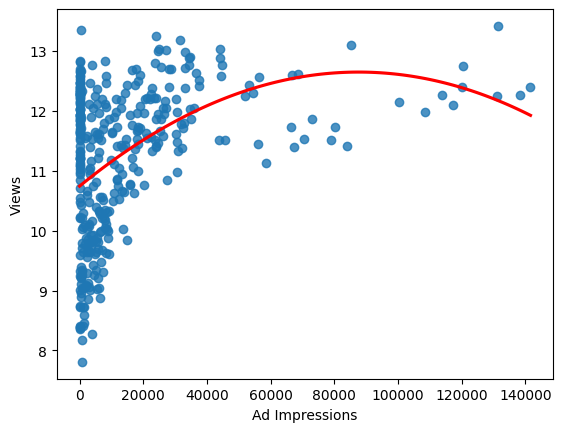

In [39]:
sns.regplot(y = np.log(df_base["Views"]), x = df_base["Ad Impressions"], data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

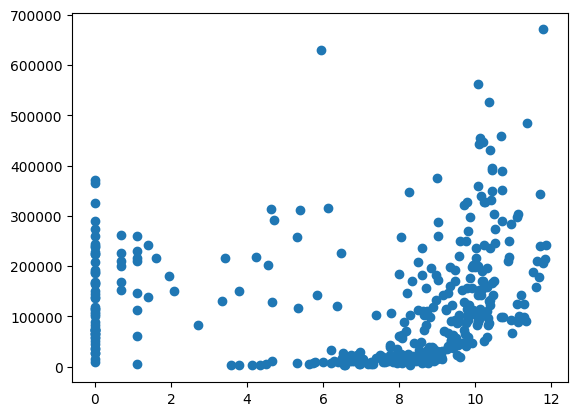

In [40]:
plt.plot(np.log(df_base["Ad Impressions"]+1), df_base["Views"], 'o')
plt.show()

<Axes: xlabel='Ad Impressions', ylabel='Views'>

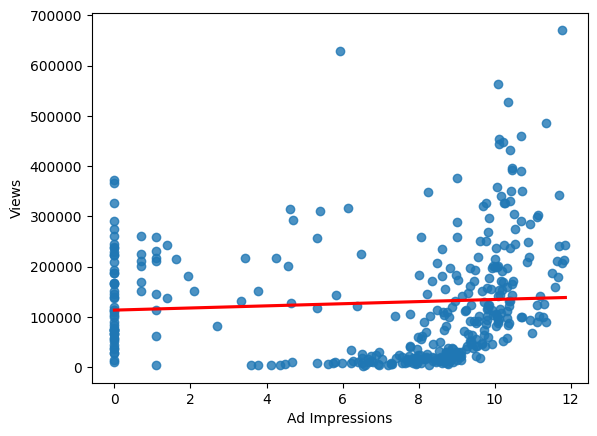

In [41]:
sns.regplot(y ="Views", x = np.log(df_base["Ad Impressions"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'))

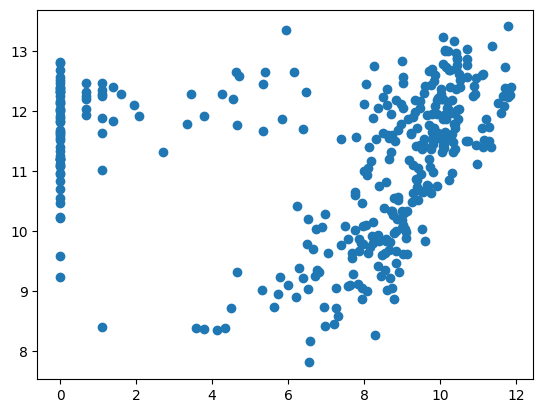

In [42]:
plt.plot(np.log(df_base["Ad Impressions"]+1), np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Ad Impressions', ylabel='Views'>

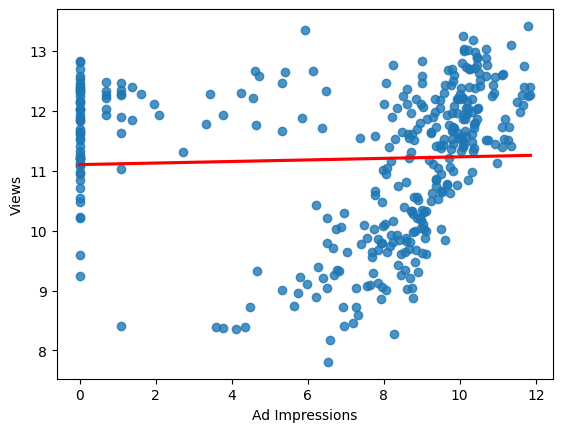

In [43]:
sns.regplot(y = np.log(df_base["Views"]), x =  np.log(df_base["Ad Impressions"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Ad Impressions', ylabel='Views'>

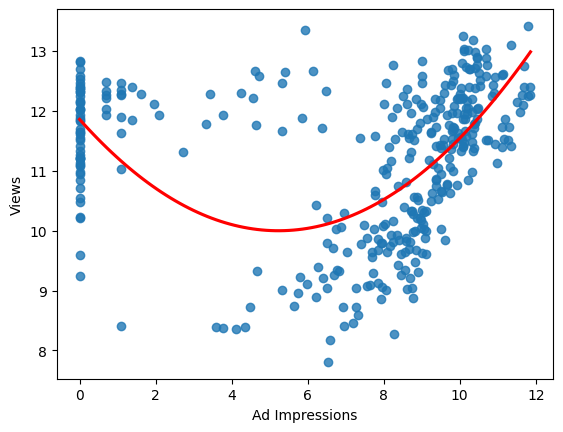

In [44]:
sns.regplot(y = np.log(df_base["Views"]), x =  np.log(df_base["Ad Impressions"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

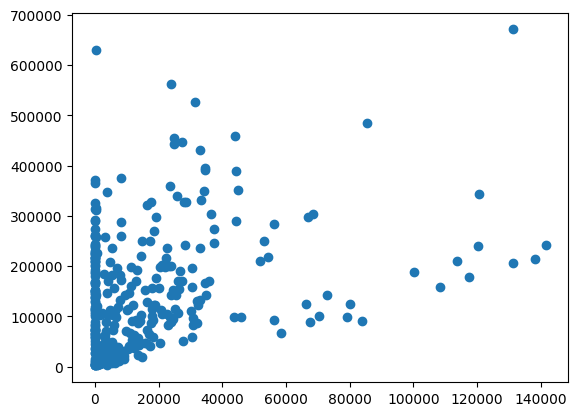

In [45]:
plt.plot(df_base["Ad Impressions"], df_base["Views"], 'o')
plt.show()

<Axes: xlabel='Ad Impressions', ylabel='Views'>

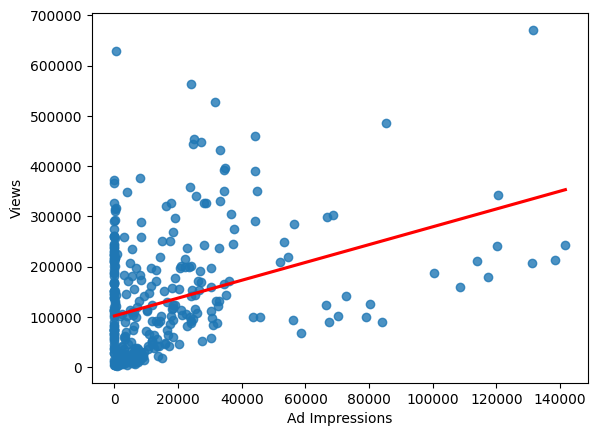

In [46]:
sns.regplot(y = df_base["Views"], x = df_base["Ad Impressions"], data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Ad Impressions', ylabel='Views'>

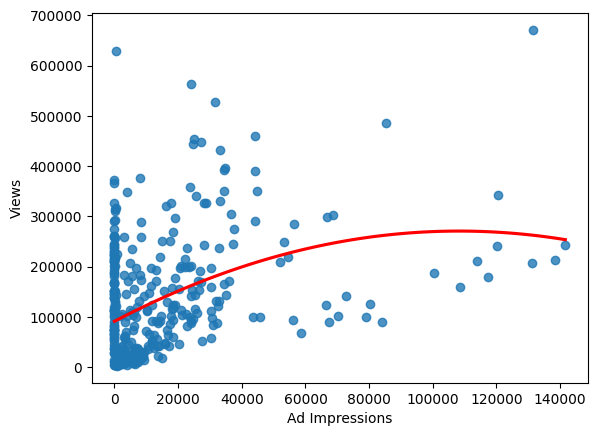

In [47]:
sns.regplot(y = df_base["Views"], x = df_base["Ad Impressions"], data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

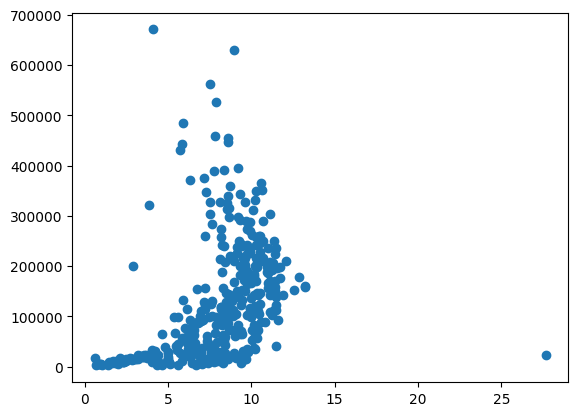

In [48]:
plt.plot(df_base["Video Thumbnail CTR (%)"], df_base["Views"], 'o')
plt.show()

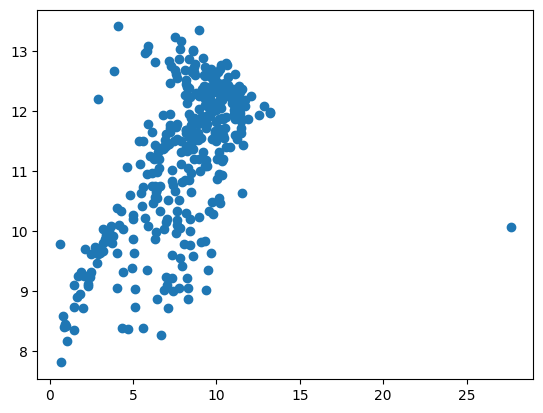

In [49]:
plt.plot(df_base["Video Thumbnail CTR (%)"], np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Video Thumbnail CTR (%)', ylabel='Views'>

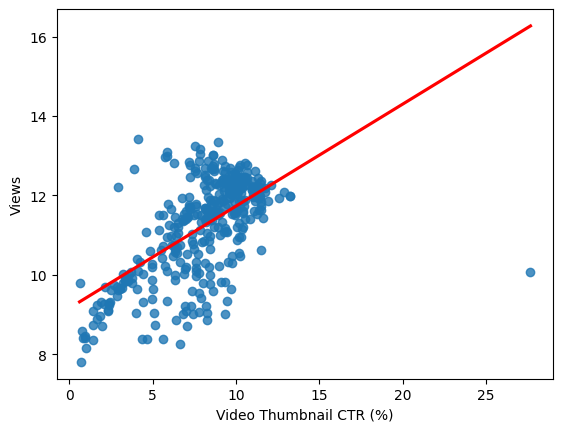

In [50]:
sns.regplot(y = np.log(df_base["Views"]), x = df_base["Video Thumbnail CTR (%)"], data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Video Thumbnail CTR (%)', ylabel='Views'>

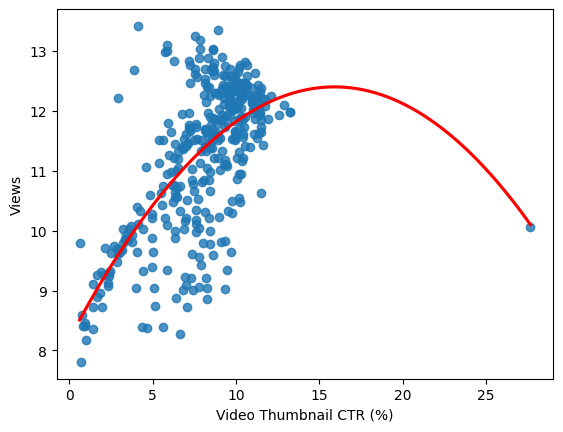

In [51]:
sns.regplot(y = np.log(df_base["Views"]), x = df_base["Video Thumbnail CTR (%)"], data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

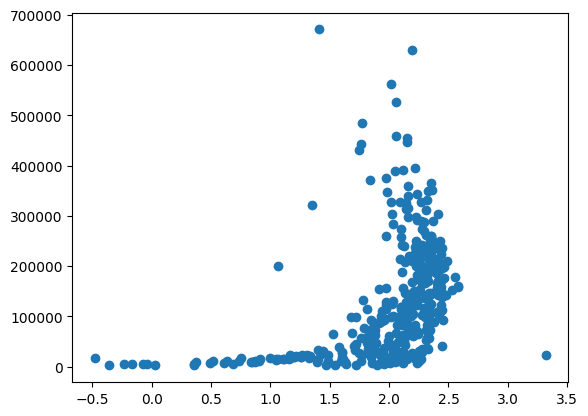

In [52]:
plt.plot(np.log(df_base["Video Thumbnail CTR (%)"]), df_base["Views"], 'o')
plt.show()

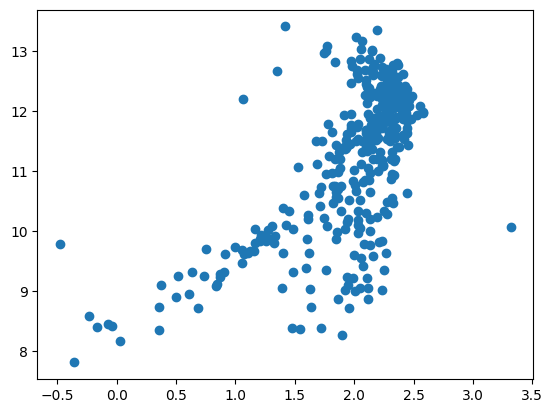

In [53]:
plt.plot(np.log(df_base["Video Thumbnail CTR (%)"]), np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Video Thumbnail CTR (%)', ylabel='Views'>

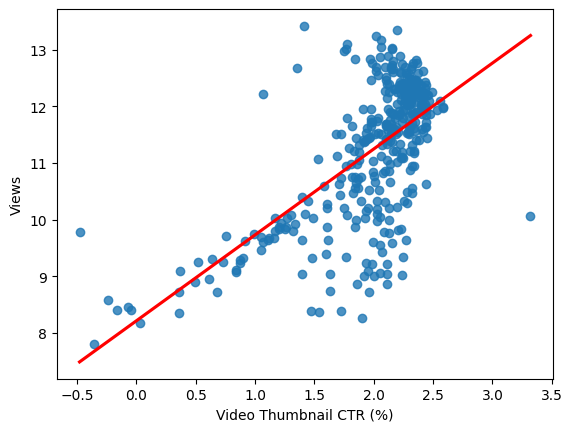

In [54]:
sns.regplot(y = np.log(df_base["Views"]), x = np.log(df_base["Video Thumbnail CTR (%)"]), data = df_base, ci = None, line_kws = dict(color = 'red'))

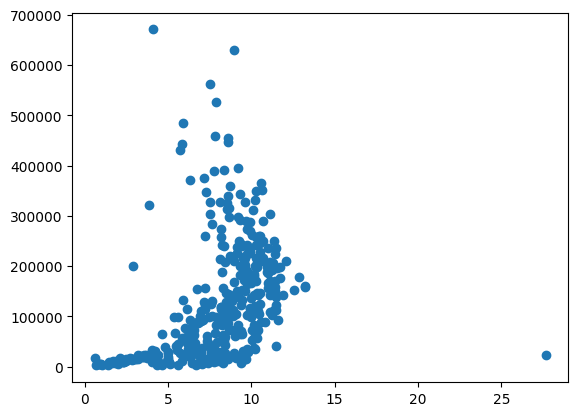

In [55]:
plt.plot(df_base["Video Thumbnail CTR (%)"], df_base["Views"], 'o')
plt.show()

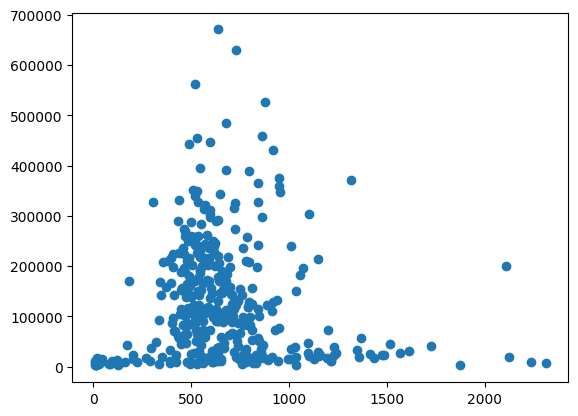

In [56]:
plt.plot(df_base["Video Duration"], df_base["Views"], 'o')
plt.show()

<Axes: xlabel='Video Duration', ylabel='Views'>

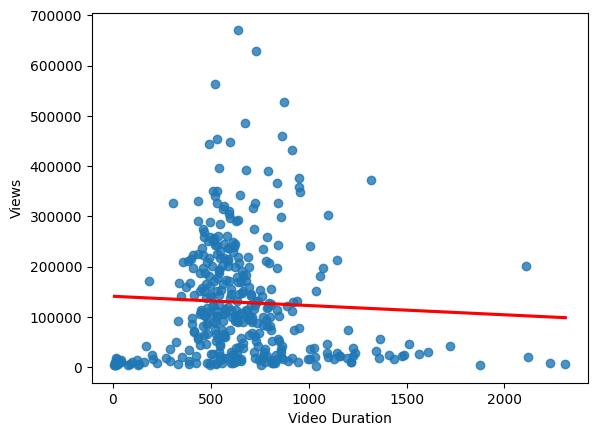

In [57]:
sns.regplot(y = df_base["Views"], x = df_base["Video Duration"], data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Video Duration', ylabel='Views'>

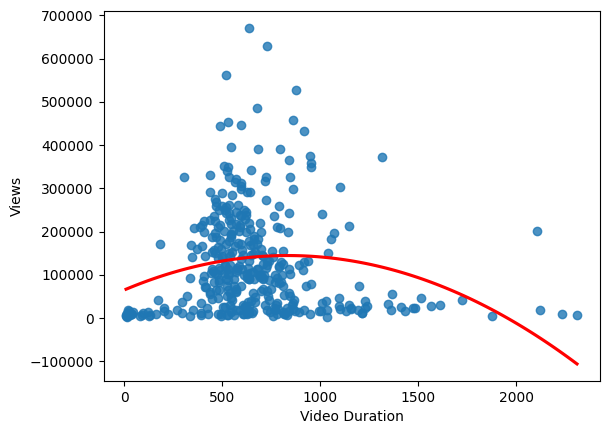

In [58]:
sns.regplot(y = df_base["Views"], x = df_base["Video Duration"], data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

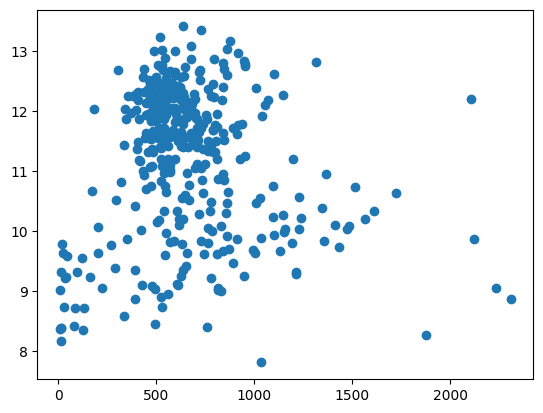

In [59]:
plt.plot(df_base["Video Duration"], np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Video Duration', ylabel='Views'>

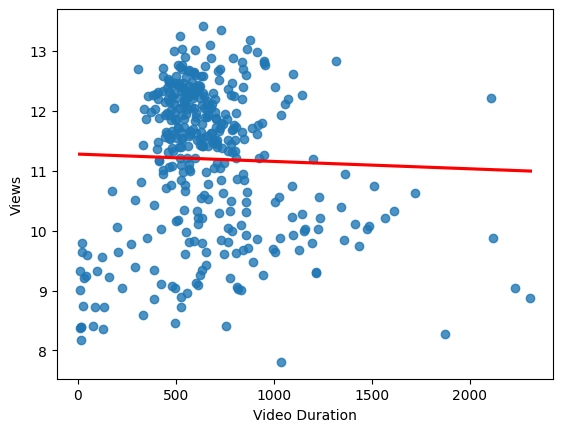

In [60]:
sns.regplot(y = np.log(df_base["Views"]), x = df_base["Video Duration"], data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Video Duration', ylabel='Views'>

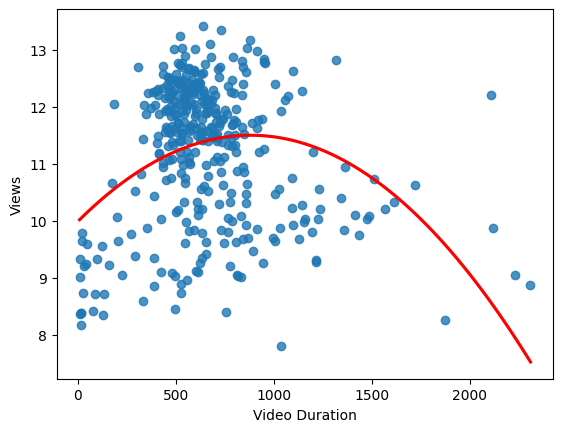

In [61]:
sns.regplot(y = np.log(df_base["Views"]), x = df_base["Video Duration"], data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

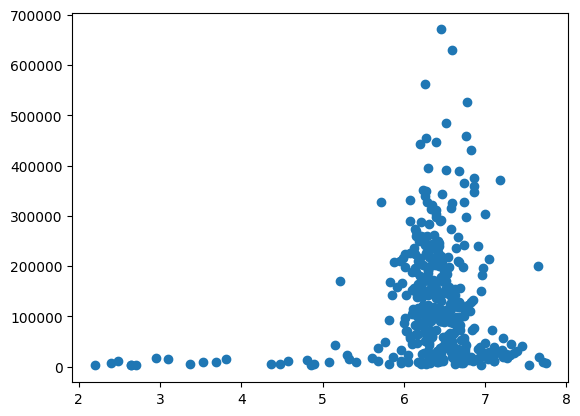

In [62]:
plt.plot(np.log(df_base["Video Duration"]), df_base["Views"], 'o')
plt.show()

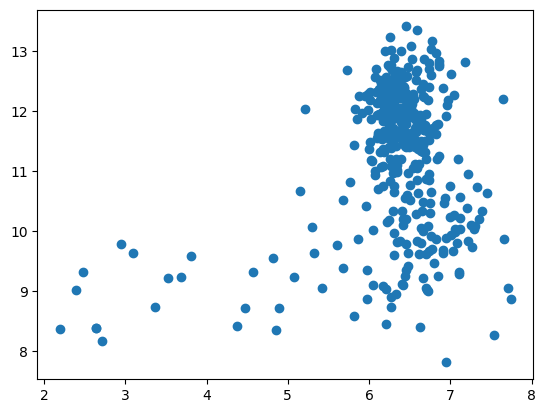

In [63]:
plt.plot(np.log(df_base["Video Duration"]), np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Video Duration', ylabel='Views'>

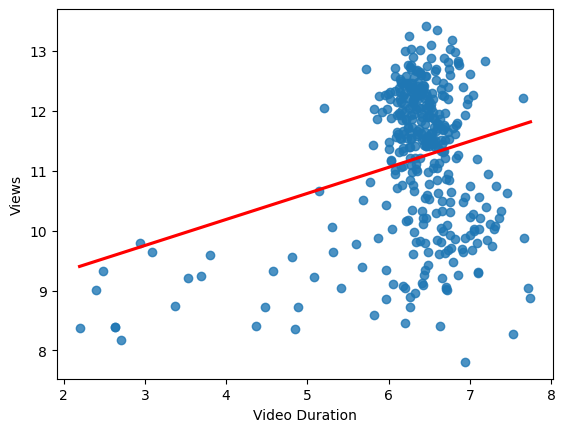

In [64]:
sns.regplot(y = np.log(df_base["Views"]), x = np.log(df_base["Video Duration"]), data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Video Duration', ylabel='Views'>

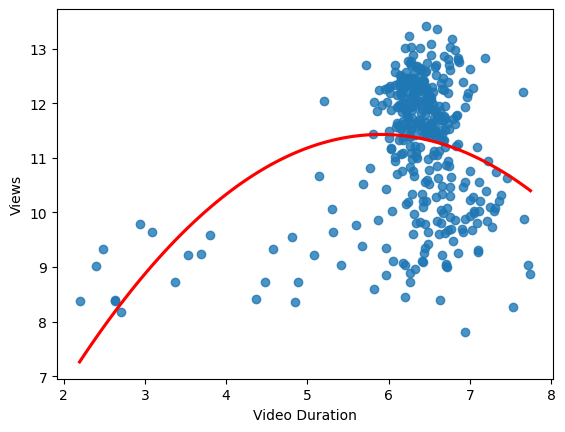

In [65]:
sns.regplot(y = np.log(df_base["Views"]), x = np.log(df_base["Video Duration"]), data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

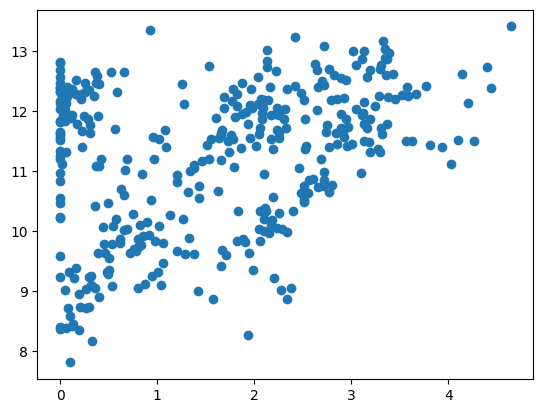

In [66]:
plt.plot(np.log(df_base["Estimated Revenue (USD)"]+1), np.log(df_base["Views"]), 'o')
plt.show()

<Axes: xlabel='Estimated Revenue (USD)', ylabel='Views'>

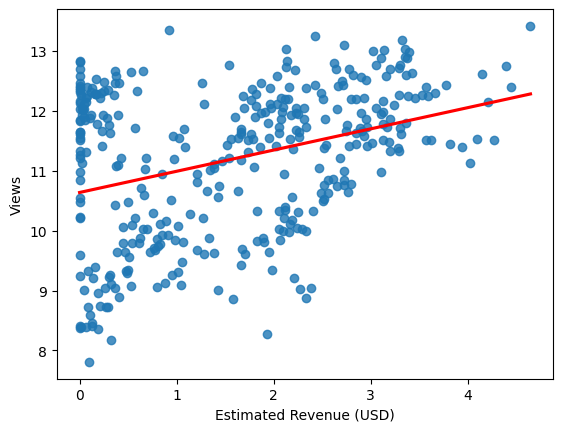

In [67]:
sns.regplot(y = np.log(df_base["Views"]), x = np.log(df_base["Estimated Revenue (USD)"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'))

<Axes: xlabel='Estimated Revenue (USD)', ylabel='Views'>

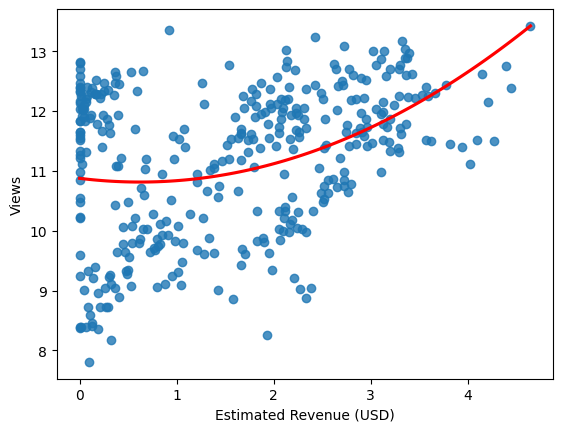

In [68]:
sns.regplot(y = np.log(df_base["Views"]), x = np.log(df_base["Estimated Revenue (USD)"]+1), data = df_base, ci = None, line_kws = dict(color = 'red'), order = 2)

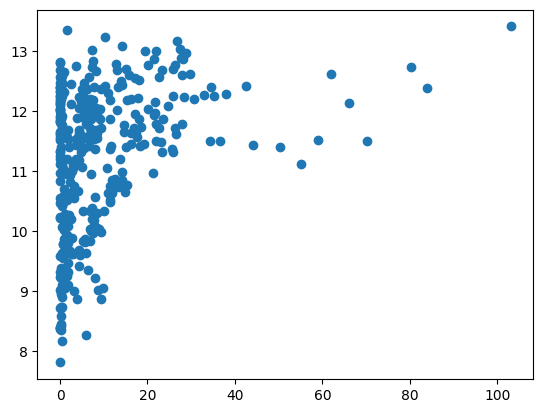

In [69]:
plt.plot(df_base["Estimated Revenue (USD)"], np.log(df_base["Views"]), 'o')
plt.show()

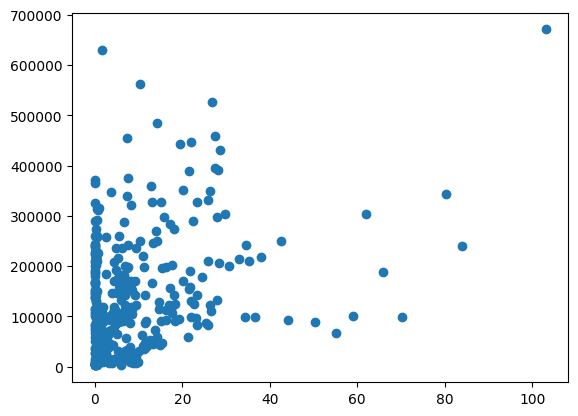

In [70]:
plt.plot(df_base["Estimated Revenue (USD)"], df_base["Views"], 'o')
plt.show()

# Nadanie czytelniejszych nazw kolumn, dodanie zmiennej kategorycznej

In [71]:
new_column_names = [
    "video_duration",
    "video_publish_time",
    "week_day",
    "ad_impressions",
    "ads_revenue",
    "comments",
    "shares",
    "dislikes",
    "likes",
    "unsubscribes",
    "playlist_watch_time",
    "avg_view_duration",
    "views",
    "new_subscribers",
    "estimated_revenue",
    "impressions",
    "vid_thumbnail_ctr_percent"
]

In [72]:
df_base_filtered2 = df_base[selected_columns]
df_base_filtered2.columns = new_column_names

In [73]:
df_base_filtered2.describe()

,video_duration,video_publish_time,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,playlist_watch_time,avg_view_duration,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent
count,364.000000,364,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,3.640000e+02,364.000000
mean,664.239011,2019-03-31 17:52:05.274725376,15117.953297,15.363964,333.846154,252.958791,123.961538,5526.733516,28.906593,24.830608,285.612637,128800.101648,349.931319,8.852052,9.595286e+05,7.914615
min,9.000000,2016-06-02 00:00:00,0.000000,0.000000,0.000000,1.000000,2.000000,121.000000,0.000000,0.000000,8.000000,2461.000000,0.000000,0.000000,3.222800e+04,0.620000
25%,496.000000,2017-06-02 12:00:00,368.500000,0.344500,104.750000,38.000000,27.000000,1205.500000,3.000000,0.409050,233.750000,27160.500000,44.500000,0.443250,1.317082e+05,6.420000
50%,613.000000,2018-01-28 00:00:00,5892.000000,7.527500,262.500000,149.000000,85.500000,5172.000000,20.000000,2.350500,286.500000,101950.500000,200.000000,4.285000,6.204065e+05,8.395000
75%,786.500000,2021-02-19 12:00:00,19372.000000,20.071750,485.000000,313.250000,179.250000,8504.750000,41.000000,39.475550,344.250000,198169.500000,464.000000,11.476250,1.368464e+06,9.920000
max,2311.000000,2024-10-18 00:00:00,141634.000000,182.796000,2510.000000,4190.000000,818.000000,27222.000000,713.000000,171.351500,776.000000,670990.000000,3925.000000,103.117000,1.270226e+07,27.660000
std,330.646183,NaN,24339.924215,23.614172,291.934648,363.016405,128.311620,4465.210998,48.591932,38.958396,116.595678,118209.844270,468.539050,13.414650,1.180519e+06,2.903383


In [74]:
df_base_filtered2.loc[:, 'past2020'] = df_base_filtered2['video_publish_time'].dt.year >= 2020
df_base_filtered2


C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\2140516864.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered2.loc[:, 'past2020'] = df_base_filtered2['video_publish_time'].dt.year >= 2020


,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,playlist_watch_time,avg_view_duration,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66,False
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85,False
2,133.0,2016-06-14,Tuesday,88.0,0.160,0.0,4.0,20.0,239.0,0.0,0.1683,41.0,6153.0,8.0,0.089,38713.0,7.07,False
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60,False
4,45.0,2016-07-01,Friday,0.0,0.000,50.0,7.0,180.0,602.0,3.0,0.0611,25.0,14659.0,31.0,0.000,46218.0,8.62,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23,True
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36,True
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28,True
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29,True


In [75]:
df_base_filtered2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364 entries, 0 to 363
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   video_duration             364 non-null    float64       
 1   video_publish_time         364 non-null    datetime64[ns]
 2   week_day                   364 non-null    object        
 3   ad_impressions             364 non-null    float64       
 4   ads_revenue                364 non-null    float64       
 5   comments                   364 non-null    float64       
 6   shares                     364 non-null    float64       
 7   dislikes                   364 non-null    float64       
 8   likes                      364 non-null    float64       
 9   unsubscribes               364 non-null    float64       
 10  playlist_watch_time        364 non-null    float64       
 11  avg_view_duration          364 non-null    float64       
 12  views   

In [76]:
df_num2 = df_base_filtered2.select_dtypes(include = 'number')

In [77]:
df_base_filtered2['week_day'].unique()

array(['Thursday', 'Friday', 'Tuesday', 'Wednesday', 'Monday', 'Sunday',
       'Saturday'], dtype=object)

In [78]:
df_base_filtered2['week_day'].value_counts(normalize = True)*100

week_day
Sunday       17.307692
Tuesday      16.483516
Wednesday    15.659341
Friday       14.835165
Saturday     13.461538
Monday       12.637363
Thursday      9.615385
Name: proportion, dtype: float64

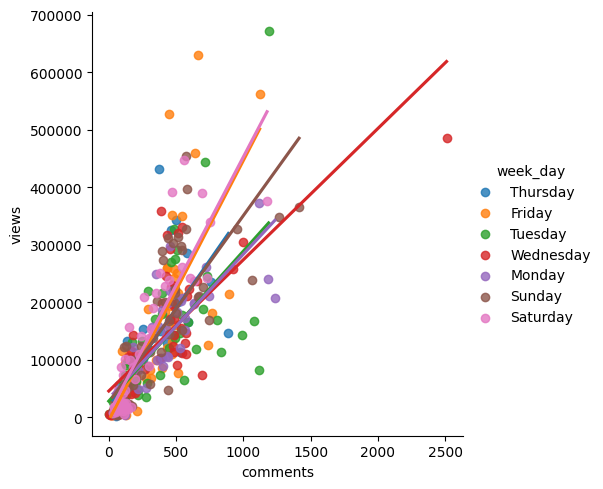

In [79]:
sns.lmplot(y ="views", x = "comments", data = df_base_filtered2, ci = None, hue = "week_day")
plt.show()

In [80]:
df_base_filtered2['past2020'].value_counts(normalize = True)*100

past2020
False    69.78022
True     30.21978
Name: proportion, dtype: float64

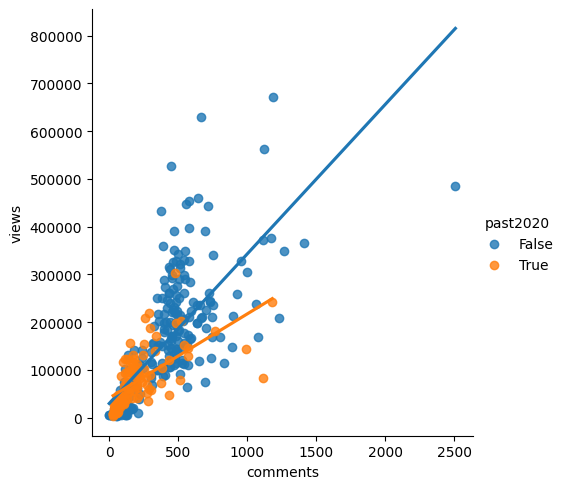

In [81]:
sns.lmplot(y ="views", x = "comments", data = df_base_filtered2, ci = None, hue = "past2020")
plt.show()

In [82]:
df_num2['past2020'] = df_base_filtered2['past2020'].astype('category')

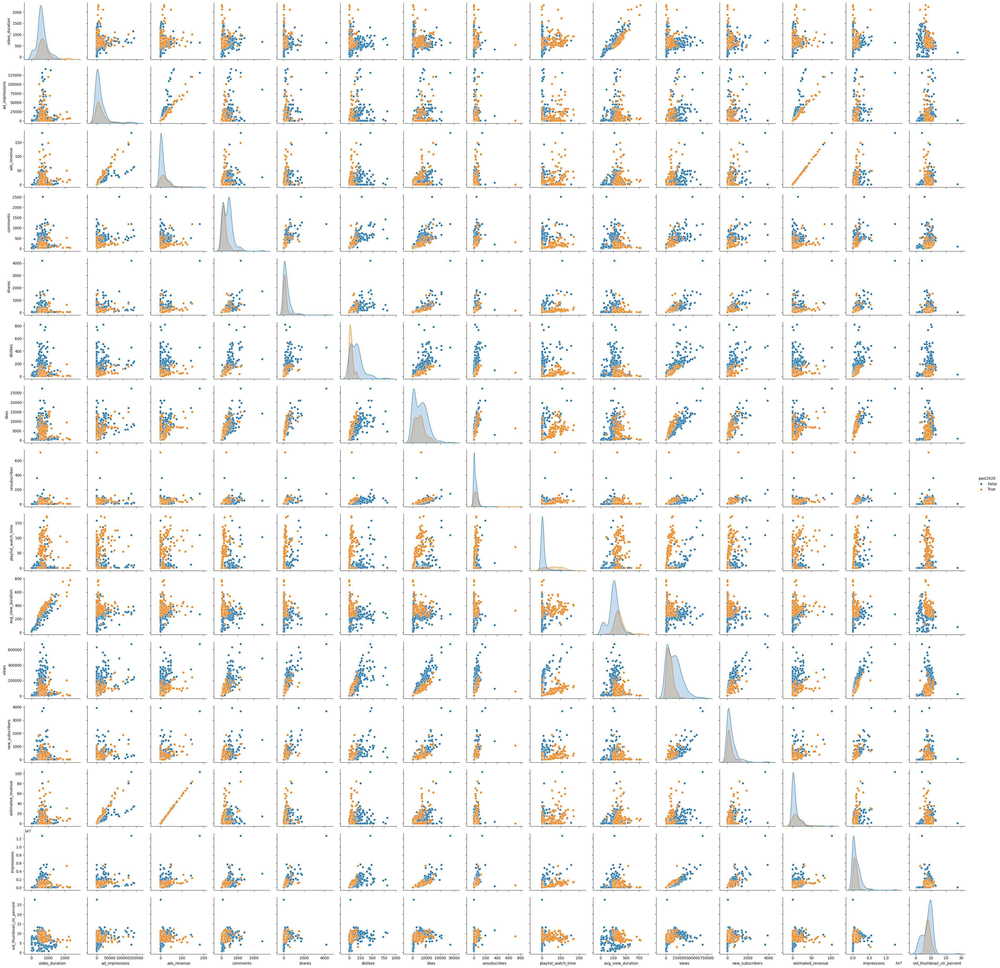

In [83]:
sns.pairplot(df_num2, hue = 'past2020')

In [84]:
df_base_filtered2.loc[df_base_filtered2["comments"] == 0, "comments"] = 1
df_base_filtered2.loc[df_base_filtered2["estimated_revenue"] == 0, "estimated_revenue"] = 1

In [85]:
df_base_filtered2

,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,playlist_watch_time,avg_view_duration,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66,False
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85,False
2,133.0,2016-06-14,Tuesday,88.0,0.160,1.0,4.0,20.0,239.0,0.0,0.1683,41.0,6153.0,8.0,0.089,38713.0,7.07,False
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60,False
4,45.0,2016-07-01,Friday,0.0,0.000,50.0,7.0,180.0,602.0,3.0,0.0611,25.0,14659.0,31.0,1.000,46218.0,8.62,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23,True
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36,True
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28,True
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29,True


# Metoda od ogółu do szczegółu

In [86]:
m1 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent + C(week_day, Treatment(reference = 'Sunday')) + np.log(video_duration) + C(past2020)", data = df_base_filtered2).fit()
m1.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                                   Results: Ordinary least squares
======================================================================================================
Model:                          OLS                          Adj. R-squared:                 0.813    
Dependent Variable:             np.log(views)                AIC:                            592.4316 
Date:                           2026-02-09 17:21             BIC:                            639.1974 
No. Observations:               364                          Log-Likelihood:                 -284.22  
Df Model:                       11                           F-statistic:                    144.1    
Df Residuals:                   352                          Prob (F-statistic):             4.90e-123
R-squared:                      0.818                        Scale:                          0.28860  
------------------------------------------------------------------------------------------------------
                                                         Coef.  Std.Err.    t    P>|t|   [0.025 0.975]
------------------------------------------------------------------------------------------------------
Intercept                                                5.9464   0.2790 21.3127 0.0000  5.3976 6.4951
C(week_day, Treatment(reference='Sunday'))[T.Friday]    -0.0112   0.1002 -0.1119 0.9109 -0.2083 0.1858
C(week_day, Treatment(reference='Sunday'))[T.Monday]    -0.1731   0.1050 -1.6481 0.1002 -0.3796 0.0335
C(week_day, Treatment(reference='Sunday'))[T.Saturday]   0.0351   0.1043  0.3364 0.7367 -0.1701 0.2403
C(week_day, Treatment(reference='Sunday'))[T.Thursday]  -0.0536   0.1141 -0.4696 0.6389 -0.2781 0.1709
C(week_day, Treatment(reference='Sunday'))[T.Tuesday]    0.0183   0.0976  0.1880 0.8510 -0.1735 0.2102
C(week_day, Treatment(reference='Sunday'))[T.Wednesday] -0.0452   0.0986 -0.4584 0.6469 -0.2390 0.1487
C(past2020)[T.True]                                     -0.0901   0.0747 -1.2055 0.2288 -0.2370 0.0569
np.log(comments)                                         0.8181   0.0349 23.4304 0.0000  0.7494 0.8868
np.log(estimated_revenue)                                0.0997   0.0177  5.6431 0.0000  0.0650 0.1345
vid_thumbnail_ctr_percent                                0.1132   0.0113 10.0532 0.0000  0.0911 0.1353
np.log(video_duration)                                  -0.0139   0.0434 -0.3204 0.7488 -0.0992 0.0714
------------------------------------------------------------------------------------------------------
Omnibus:                          27.274                   Durbin-Watson:                      1.264  
Prob(Omnibus):                    0.000                    Jarque-Bera (JB):                   105.529
Skew:                             0.044                    Prob(JB):                           0.000  
Kurtosis:                         5.636                    Condition No.:                      121    
======================================================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [87]:
hip1 = "(C(week_day, Treatment(reference='Sunday'))[T.Friday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Monday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Saturday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Thursday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Tuesday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Wednesday] = 0)"
m1.f_test(hip1)

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=0.7918318059830796, p=0.5767854807854806, df_denom=352, df_num=6>

In [88]:
m2 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) +  vid_thumbnail_ctr_percent + np.log(video_duration) +  C(past2020)", data = df_base_filtered2).fit()
m2.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                    Results: Ordinary least squares
========================================================================
Model:                OLS                Adj. R-squared:       0.813    
Dependent Variable:   np.log(views)      AIC:                  585.3117 
Date:                 2026-02-09 17:21   BIC:                  608.6946 
No. Observations:     364                Log-Likelihood:       -286.66  
Df Model:             5                  F-statistic:          317.1    
Df Residuals:         358                Prob (F-statistic):   4.10e-129
R-squared:            0.816              Scale:                0.28759  
------------------------------------------------------------------------
                           Coef.  Std.Err.    t    P>|t|   [0.025 0.975]
------------------------------------------------------------------------
Intercept                  5.9280   0.2671 22.1924 0.0000  5.4027 6.4533
C(past2020)[T.True]       -0.0800   0.0725 -1.1033 0.2707 -0.2226 0.0626
np.log(comments)           0.8151   0.0343 23.7547 0.0000  0.7476 0.8826
np.log(estimated_revenue)  0.0990   0.0175  5.6700 0.0000  0.0647 0.1334
vid_thumbnail_ctr_percent  0.1118   0.0112  9.9738 0.0000  0.0898 0.1338
np.log(video_duration)    -0.0115   0.0428 -0.2677 0.7891 -0.0956 0.0727
------------------------------------------------------------------------
Omnibus:                 26.064         Durbin-Watson:            1.260 
Prob(Omnibus):           0.000          Jarque-Bera (JB):         96.337
Skew:                    0.045          Prob(JB):                 0.000 
Kurtosis:                5.519          Condition No.:            113   
========================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is
correctly specified.
"""

In [89]:
hip2 = "(C(week_day, Treatment(reference='Sunday'))[T.Friday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Monday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Saturday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Thursday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Tuesday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Wednesday] = 0), (np.log(video_duration) = 0)"
m1.f_test(hip2)

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=0.6889157814836608, p=0.6814821177111572, df_denom=352, df_num=7>

In [90]:
m3 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent + C(past2020)", data = df_base_filtered2).fit()
m3.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                    Results: Ordinary least squares
========================================================================
Model:                OLS                Adj. R-squared:       0.814    
Dependent Variable:   np.log(views)      AIC:                  583.3845 
Date:                 2026-02-09 17:21   BIC:                  602.8703 
No. Observations:     364                Log-Likelihood:       -286.69  
Df Model:             4                  F-statistic:          397.4    
Df Residuals:         359                Prob (F-statistic):   2.00e-130
R-squared:            0.816              Scale:                0.28684  
------------------------------------------------------------------------
                           Coef.  Std.Err.    t    P>|t|   [0.025 0.975]
------------------------------------------------------------------------
Intercept                  5.8709   0.1606 36.5523 0.0000  5.5550 6.1867
C(past2020)[T.True]       -0.0847   0.0702 -1.2058 0.2287 -0.2228 0.0534
np.log(comments)           0.8119   0.0321 25.2559 0.0000  0.7487 0.8751
np.log(estimated_revenue)  0.0978   0.0168  5.8197 0.0000  0.0647 0.1308
vid_thumbnail_ctr_percent  0.1124   0.0110 10.2208 0.0000  0.0907 0.1340
------------------------------------------------------------------------
Omnibus:                 26.191         Durbin-Watson:            1.252 
Prob(Omnibus):           0.000          Jarque-Bera (JB):         96.982
Skew:                    0.053          Prob(JB):                 0.000 
Kurtosis:                5.527          Condition No.:            60    
========================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is
correctly specified.
"""

In [91]:
hip3 = "(C(week_day, Treatment(reference='Sunday'))[T.Friday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Monday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Saturday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Thursday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Tuesday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Wednesday] = 0), (np.log(video_duration) = 0), (C(past2020)[T.True] = 0)"
m1.f_test(hip3)

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=0.7834416191492363, p=0.6175598378921641, df_denom=352, df_num=8>

In [92]:
m4 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2).fit()
m4.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                   Results: Ordinary least squares
======================================================================
Model:                OLS               Adj. R-squared:      0.813    
Dependent Variable:   np.log(views)     AIC:                 582.8557 
Date:                 2026-02-09 17:21  BIC:                 598.4444 
No. Observations:     364               Log-Likelihood:      -287.43  
Df Model:             3                 F-statistic:         528.7    
Df Residuals:         360               Prob (F-statistic):  1.65e-131
R-squared:            0.815             Scale:               0.28721  
----------------------------------------------------------------------
                          Coef.  Std.Err.    t    P>|t|  [0.025 0.975]
----------------------------------------------------------------------
Intercept                 5.7896   0.1459 39.6901 0.0000 5.5027 6.0764
np.log(comments)          0.8268   0.0297 27.8328 0.0000 0.7684 0.8852
np.log(estimated_revenue) 0.0896   0.0154  5.8267 0.0000 0.0594 0.1198
vid_thumbnail_ctr_percent 0.1103   0.0109 10.1491 0.0000 0.0890 0.1317
----------------------------------------------------------------------
Omnibus:                28.357        Durbin-Watson:           1.268  
Prob(Omnibus):          0.000         Jarque-Bera (JB):        110.607
Skew:                   0.099         Prob(JB):                0.000  
Kurtosis:               5.693         Condition No.:           53     
======================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is
correctly specified.
"""

In [93]:
stargazer = Stargazer([m1, m2, m3, m4])
HTML(stargazer.render_html())

In [94]:
hip_laczna_niestotnosc = "(C(week_day, Treatment(reference='Sunday'))[T.Friday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Monday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Saturday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Thursday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Tuesday] = 0), (C(week_day, Treatment(reference='Sunday'))[T.Wednesday] = 0), (np.log(video_duration) = 0), (C(past2020)[T.True] = 0), (np.log(comments) = 0), (np.log(estimated_revenue) = 0), (vid_thumbnail_ctr_percent = 0)"
m1.f_test(hip_laczna_niestotnosc)

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=144.0743067600525, p=4.9041922250630126e-123, df_denom=352, df_num=11>

In [95]:
hip_niestotnosc_kom = 'np.log(comments) = 0'

In [96]:
m1.t_test(hip_niestotnosc_kom)

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.8181      0.035     23.430      0.000       0.749       0.887

# Testy

In [97]:
plt.rc('figure', figsize = (12,8))

Text(0, 0.5, 'residuals')

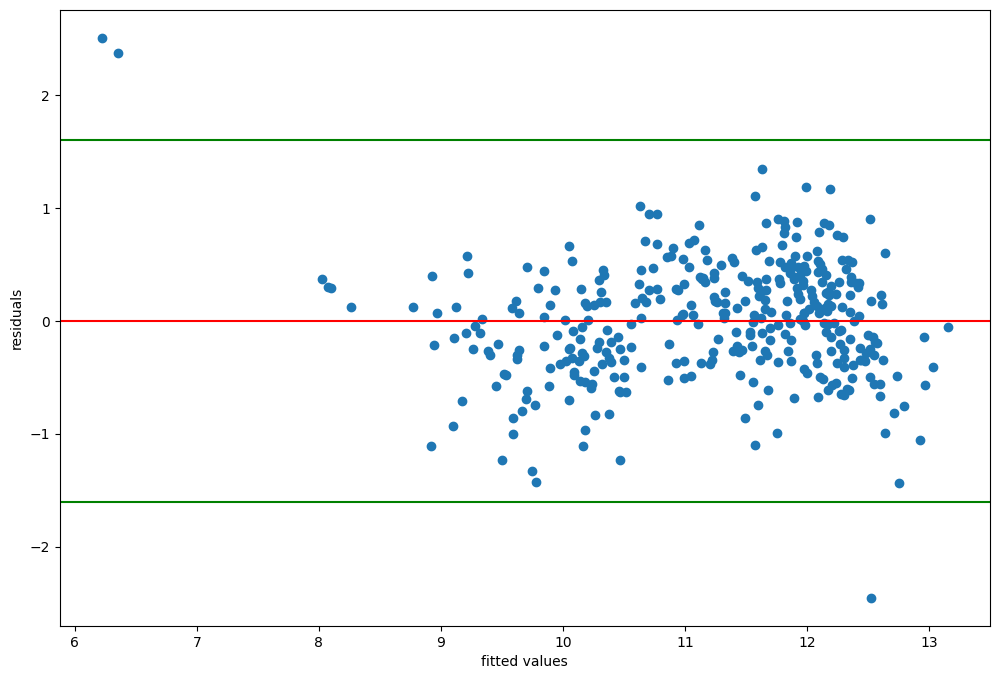

In [198]:
plt.scatter(m4.fittedvalues, m4.resid)
plt.xlabel('fitted values')
plt.axhline(y = 0, color = 'red')
plt.axhline(y = 0 + 3*m4.resid.std(), color = 'green')
plt.axhline(y = 0 - 3*m4.resid.std(), color = 'green')
plt.ylabel('residuals')
#plt.savefig('homoskeda.jpg')

In [99]:
test_bp = sms.het_breuschpagan(m4.resid, m4.model.exog)
test_bp

(38.481275810855,
 2.2353087721557576e-08,
 14.185829429029777,
 9.296307387934937e-09)

In [100]:
name1 = ['lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
lzip(name1, test_bp)

[('lagrange multiplier statistic', 38.481275810855),
 ('p-value', 2.2353087721557576e-08),
 ('f-value', 14.185829429029777),
 ('f p-value', 9.296307387934937e-09)]

In [101]:
test_w = sms.het_white(m4.resid, m4.model.exog)
lzip(name1, test_w)

[('lagrange multiplier statistic', 240.8940427936708),
 ('p-value', 8.324590862097102e-47),
 ('f-value', 76.96756435057858),
 ('f p-value', 7.291226253256705e-78)]

## Próba naprawienia problemu heteroskedastyczności

In [102]:
df_base_filtered2['residuals2'] = m4.resid*m4.resid

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\4026669543.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered2['residuals2'] = m4.resid*m4.resid


In [103]:
df_base_filtered2

,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,playlist_watch_time,avg_view_duration,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020,residuals2
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66,False,6.019383
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85,False,0.000155
2,133.0,2016-06-14,Tuesday,88.0,0.160,1.0,4.0,20.0,239.0,0.0,0.1683,41.0,6153.0,8.0,0.089,38713.0,7.07,False,5.624854
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60,False,0.085232
4,45.0,2016-07-01,Friday,0.0,0.000,50.0,7.0,180.0,602.0,3.0,0.0611,25.0,14659.0,31.0,1.000,46218.0,8.62,False,0.146190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23,True,0.942088
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36,True,0.558799
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28,True,1.238041
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29,True,0.643642


In [104]:
m5 = smf.ols(formula = "residuals2 ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2).fit()
m5.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                     Results: Ordinary least squares
=========================================================================
Model:                  OLS                Adj. R-squared:       0.098   
Dependent Variable:     residuals2         AIC:                  646.8369
Date:                   2026-02-09 17:21   BIC:                  662.4256
No. Observations:       364                Log-Likelihood:       -319.42 
Df Model:               3                  F-statistic:          14.19   
Df Residuals:           360                Prob (F-statistic):   9.30e-09
R-squared:              0.106              Scale:                0.34240 
-------------------------------------------------------------------------
                           Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
-------------------------------------------------------------------------
Intercept                  1.0245   0.1593  6.4323 0.0000  0.7113  1.3377
np.log(comments)          -0.2028   0.0324 -6.2516 0.0000 -0.2665 -0.1390
np.log(estimated_revenue) -0.0090   0.0168 -0.5391 0.5902 -0.0421  0.0240
vid_thumbnail_ctr_percent  0.0453   0.0119  3.8123 0.0002  0.0219  0.0686
-------------------------------------------------------------------------
Omnibus:                395.269        Durbin-Watson:           1.847    
Prob(Omnibus):          0.000          Jarque-Bera (JB):        18168.817
Skew:                   4.805          Prob(JB):                0.000    
Kurtosis:               36.250         Condition No.:           53       
=========================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is
correctly specified.
"""

In [105]:
m5_1 = smf.ols(formula = "residuals2 ~ np.log(comments) + np.log(estimated_revenue) + np.log(vid_thumbnail_ctr_percent)", data = df_base_filtered2).fit()
m5_1.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                         Results: Ordinary least squares
=================================================================================
Model:                    OLS                   Adj. R-squared:          0.065   
Dependent Variable:       residuals2            AIC:                     660.0101
Date:                     2026-02-09 17:21      BIC:                     675.5987
No. Observations:         364                   Log-Likelihood:          -326.01 
Df Model:                 3                     F-statistic:             9.416   
Df Residuals:             360                   Prob (F-statistic):      5.26e-06
R-squared:                0.073                 Scale:                   0.35502 
---------------------------------------------------------------------------------
                                   Coef.  Std.Err.    t    P>|t|   [0.025  0.975]
---------------------------------------------------------------------------------
Intercept                          1.0327   0.1710  6.0389 0.0000  0.6964  1.3690
np.log(comments)                  -0.1652   0.0327 -5.0484 0.0000 -0.2296 -0.1009
np.log(estimated_revenue)         -0.0064   0.0173 -0.3684 0.7128 -0.0405  0.0277
np.log(vid_thumbnail_ctr_percent)  0.0741   0.0671  1.1053 0.2698 -0.0578  0.2060
---------------------------------------------------------------------------------
Omnibus:                  437.128           Durbin-Watson:              1.817    
Prob(Omnibus):            0.000             Jarque-Bera (JB):           29322.222
Skew:                     5.540             Prob(JB):                   0.000    
Kurtosis:                 45.551            Condition No.:              34       
=================================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly
specified.
"""

In [106]:
m5_2 = smf.ols(formula = "residuals2 ~ comments + np.log(estimated_revenue) + np.log(vid_thumbnail_ctr_percent)", data = df_base_filtered2).fit()
m5_2.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                        Results: Ordinary least squares
================================================================================
Model:                   OLS                   Adj. R-squared:          -0.000  
Dependent Variable:      residuals2            AIC:                     684.5671
Date:                    2026-02-09 17:21      BIC:                     700.1557
No. Observations:        364                   Log-Likelihood:          -338.28 
Df Model:                3                     F-statistic:             0.9735  
Df Residuals:            360                   Prob (F-statistic):      0.405   
R-squared:               0.008                 Scale:                   0.37979 
--------------------------------------------------------------------------------
                                   Coef.  Std.Err.    t    P>|t|   [0.025 0.975]
--------------------------------------------------------------------------------
Intercept                          0.4217   0.1255  3.3590 0.0009  0.1748 0.6686
comments                          -0.0001   0.0001 -0.5808 0.5617 -0.0003 0.0002
np.log(estimated_revenue)         -0.0167   0.0178 -0.9380 0.3489 -0.0517 0.0183
np.log(vid_thumbnail_ctr_percent) -0.0498   0.0671 -0.7415 0.4589 -0.1818 0.0822
--------------------------------------------------------------------------------
Omnibus:                 499.909           Durbin-Watson:              1.784    
Prob(Omnibus):           0.000             Jarque-Bera (JB):           54325.414
Skew:                    6.839             Prob(JB):                   0.000    
Kurtosis:                61.265            Condition No.:              1925     
================================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly
specified.
[2] The condition number is large, 1.93e+03. This might indicate
that there are strong multicollinearity or other numerical
problems.
"""

In [107]:
m5_3 = smf.ols(formula = "np.log(views) ~ comments + np.log(estimated_revenue) + np.log(vid_thumbnail_ctr_percent)", data = df_base_filtered2).fit()
sms.het_breuschpagan(m5_3.resid, m5_3.model.exog)


(23.059773218235513,
 3.9240927259494364e-05,
 8.116298895875163,
 3.0371722685853456e-05)

In [108]:
m6 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2).fit(cov_type = "HC0")
m6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.815
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     183.8
Date:                Mon, 09 Feb 2026   Prob (F-statistic):           2.87e-72
Time:                        17:21:54   Log-Likelihood:                -287.43
No. Observations:                 364   AIC:                             582.9
Df Residuals:                     360   BIC:                             598.4
Df Model:                           3                                         
Covariance Type:                  HC0                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     5.7896      0.266     21.748      0.000       5.268       6.311
np.log(comments)              0.8268      0.065     12.800      0.000       0.700       0.953
np.log(estimated_revenue)     0.0896      0.015      6.012      0.000       0.060       0.119
vid_thumbnail_ctr_percent     0.1103      0.025      4.464      0.000       0.062       0.159
==============================================================================
Omnibus:                       28.357   Durbin-Watson:                   1.268
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              110.607
Skew:                           0.099   Prob(JB):                     9.59e-25
Kurtosis:                       5.693   Cond. No.                         53.0
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [109]:
Stargazer([m4, m6])

In [110]:
df_base_filtered2['residuals'] = m4.resid

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\3830799666.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered2['residuals'] = m4.resid


In [111]:
df_base_filtered2['predictions'] = m4.predict()

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\1342060546.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered2['predictions'] = m4.predict()


<Axes: xlabel='predictions', ylabel='residuals'>

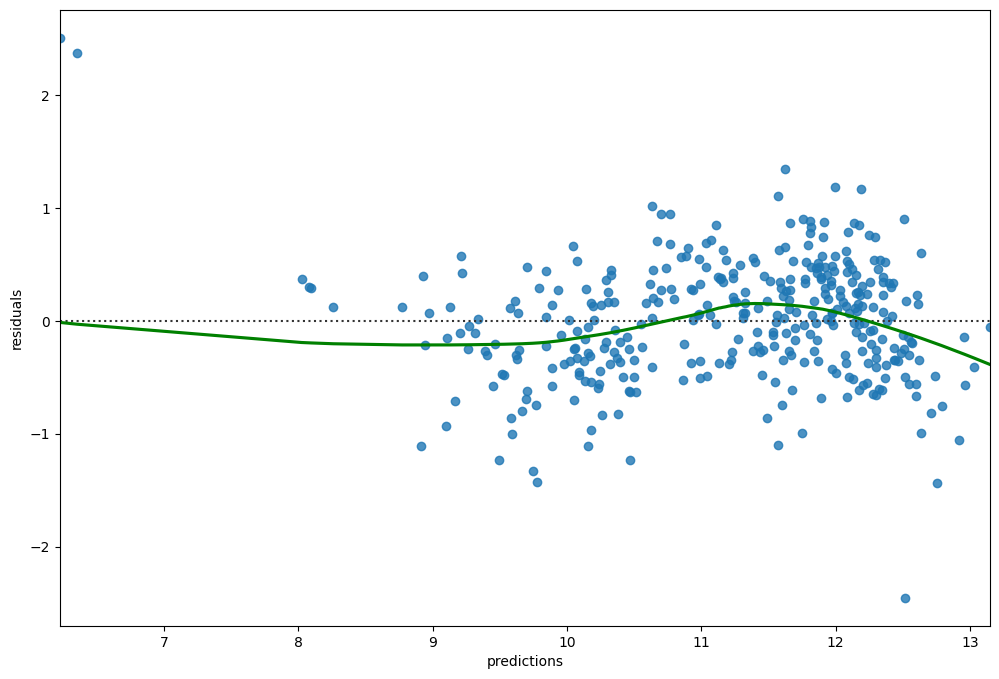

In [112]:
sns.residplot(data = df_base_filtered2, x = 'predictions' , y = 'residuals', lowess = True, line_kws = dict(color = 'g'))

In [113]:
sms.linear_reset(m4, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=122.75260895855251, p-value=2.211106417300321e-27, df_denom=2>

In [114]:
sms.linear_reset(m4, power = 3, test_type = 'exog')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=181.58710016471517, p-value=1.5613780965934648e-36, df_denom=6>

## Próba naprawy problemu nieliniowości

In [115]:
df_base_filtered3 = df_base[selected_columns]
df_base_filtered3.columns = new_column_names
df_base_filtered3.loc[:, 'past2020'] = df_base_filtered3['video_publish_time'].dt.year >= 2020
df_base_filtered3

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\1761873466.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered3.loc[:, 'past2020'] = df_base_filtered3['video_publish_time'].dt.year >= 2020


,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,playlist_watch_time,avg_view_duration,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66,False
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85,False
2,133.0,2016-06-14,Tuesday,88.0,0.160,0.0,4.0,20.0,239.0,0.0,0.1683,41.0,6153.0,8.0,0.089,38713.0,7.07,False
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60,False
4,45.0,2016-07-01,Friday,0.0,0.000,50.0,7.0,180.0,602.0,3.0,0.0611,25.0,14659.0,31.0,0.000,46218.0,8.62,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23,True
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36,True
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28,True
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29,True


In [116]:
df_base_filtered3 = df_base_filtered3[(df_base_filtered3['comments'] != 0) & (df_base_filtered3['estimated_revenue'] != 0)]

In [117]:
df_base_filtered3

,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,playlist_watch_time,avg_view_duration,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,0.2974,81.0,23531.0,54.0,0.561,41118.0,27.66,False
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,0.5187,156.0,11478.0,34.0,0.648,41627.0,5.85,False
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,0.0640,14.0,4398.0,2.0,0.017,35245.0,5.60,False
5,496.0,2016-07-08,Friday,673.0,0.551,27.0,3.0,17.0,290.0,1.0,0.5130,182.0,8415.0,20.0,0.305,40395.0,5.09,False
6,9.0,2016-08-05,Friday,43.0,0.004,16.0,14.0,8.0,151.0,0.0,0.0208,10.0,4330.0,4.0,0.003,34250.0,4.67,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,2.5909,396.0,10018.0,22.0,8.063,97065.0,8.23,True
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,4.2081,344.0,8298.0,13.0,8.705,65912.0,9.36,True
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,0.0000,703.0,8487.0,17.0,9.852,76517.0,8.28,True
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,1.4019,244.0,7060.0,17.0,3.858,67091.0,8.29,True


In [118]:
m_n4 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered3).fit()
m_n4.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                   Results: Ordinary least squares
======================================================================
Model:                OLS               Adj. R-squared:      0.843    
Dependent Variable:   np.log(views)     AIC:                 480.1398 
Date:                 2026-02-09 17:21  BIC:                 495.3604 
No. Observations:     332               Log-Likelihood:      -236.07  
Df Model:             3                 F-statistic:         591.5    
Df Residuals:         328               Prob (F-statistic):  6.30e-132
R-squared:            0.844             Scale:               0.24570  
----------------------------------------------------------------------
                          Coef.  Std.Err.    t    P>|t|  [0.025 0.975]
----------------------------------------------------------------------
Intercept                 5.3829   0.1489 36.1596 0.0000 5.0900 5.6757
np.log(comments)          0.9184   0.0309 29.6978 0.0000 0.8576 0.9792
np.log(estimated_revenue) 0.0946   0.0146  6.5004 0.0000 0.0660 0.1233
vid_thumbnail_ctr_percent 0.0971   0.0105  9.2529 0.0000 0.0765 0.1177
----------------------------------------------------------------------
Omnibus:               13.660         Durbin-Watson:            1.159 
Prob(Omnibus):         0.001          Jarque-Bera (JB):         15.101
Skew:                  -0.421         Prob(JB):                 0.001 
Kurtosis:              3.619          Condition No.:            56    
======================================================================
Notes:
[1] Standard Errors assume that the covariance matrix of the errors is
correctly specified.
"""

In [119]:
sms.linear_reset(m_n4, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=55.95984146354846, p-value=7.054639441170349e-13, df_denom=2>

In [120]:
m6a = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + np.log(vid_thumbnail_ctr_percent)", data = df_base_filtered2).fit(cov_type = "HC0")
m6a.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.838
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     291.8
Date:                Mon, 09 Feb 2026   Prob (F-statistic):           5.18e-96
Time:                        17:21:55   Log-Likelihood:                -263.83
No. Observations:                 364   AIC:                             535.7
Df Residuals:                     360   BIC:                             551.3
Df Model:                           3                                         
Covariance Type:                  HC0                                         
=====================================================================================================
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                             5.3378      0.235     22.753      0.000       4.878       5.798
np.log(comments)                      0.8099      0.055     14.642      0.000       0.701       0.918
np.log(estimated_revenue)             0.0688      0.014      5.031      0.000       0.042       0.096
np.log(vid_thumbnail_ctr_percent)     0.7307      0.084      8.734      0.000       0.567       0.895
==============================================================================
Omnibus:                       25.811   Durbin-Watson:                   1.271
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               51.669
Skew:                           0.397   Prob(JB):                     6.03e-12
Kurtosis:                       4.666   Cond. No.                         33.5
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [121]:
sms.linear_reset(m6a, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=107.82643151644822, p-value=3.852901395243232e-24, df_denom=2>

In [122]:
m6b = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.power(np.log(comments), 2) + np.log(estimated_revenue) + np.log(vid_thumbnail_ctr_percent)", data = df_base_filtered2).fit(cov_type = "HC0")
m6b.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.849
Model:                            OLS   Adj. R-squared:                  0.848
Method:                 Least Squares   F-statistic:                     408.8
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          3.23e-132
Time:                        17:21:55   Log-Likelihood:                -250.18
No. Observations:                 364   AIC:                             510.4
Df Residuals:                     359   BIC:                             529.8
Df Model:                           4                                         
Covariance Type:                  HC0                                         
=====================================================================================================
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Intercept                             6.8486      0.491     13.937      0.000       5.885       7.812
np.log(comments)                      0.1751      0.191      0.917      0.359      -0.199       0.549
np.power(np.log(comments), 2)         0.0660      0.019      3.493      0.000       0.029       0.103
np.log(estimated_revenue)             0.0812      0.014      5.897      0.000       0.054       0.108
np.log(vid_thumbnail_ctr_percent)     0.6836      0.072      9.558      0.000       0.543       0.824
==============================================================================
Omnibus:                        1.840   Durbin-Watson:                   1.199
Prob(Omnibus):                  0.399   Jarque-Bera (JB):                1.590
Skew:                          -0.143   Prob(JB):                        0.452
Kurtosis:                       3.150   Cond. No.                         432.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [123]:
sms.linear_reset(m6b, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=79.14355978728247, p-value=6.519200725115767e-18, df_denom=2>

In [124]:
m6c = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.power(np.log(comments), 2) + np.log(estimated_revenue) + np.power(np.log(estimated_revenue), 2) + np.log(vid_thumbnail_ctr_percent)", data = df_base_filtered2).fit(cov_type = "HC0")
m6c.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.854
Method:                 Least Squares   F-statistic:                     332.6
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          3.84e-132
Time:                        17:21:55   Log-Likelihood:                -242.18
No. Observations:                 364   AIC:                             496.4
Df Residuals:                     358   BIC:                             519.7
Df Model:                           5                                         
Covariance Type:                  HC0                                         
==========================================================================================================
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                  6.5666      0.571     11.497      0.000       5.447       7.686
np.log(comments)                           0.2605      0.221      1.180      0.238      -0.172       0.693
np.power(np.log(comments), 2)              0.0562      0.022      2.603      0.009       0.014       0.099
np.log(estimated_revenue)                  0.0637      0.014      4.532      0.000       0.036       0.091
np.power(np.log(estimated_revenue), 2)     0.0219      0.006      3.934      0.000       0.011       0.033
np.log(vid_thumbnail_ctr_percent)          0.7008      0.071      9.898      0.000       0.562       0.840
==============================================================================
Omnibus:                        3.846   Durbin-Watson:                   1.235
Prob(Omnibus):                  0.146   Jarque-Bera (JB):                4.067
Skew:                          -0.130   Prob(JB):                        0.131
Kurtosis:                       3.448   Cond. No.                         447.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [125]:
sms.linear_reset(m6c, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=75.96678466101395, p-value=3.1917017879382047e-17, df_denom=2>

In [126]:
m6d = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.power(np.log(comments), 2) + np.log(estimated_revenue) + np.power(np.log(estimated_revenue), 2) + np.log(vid_thumbnail_ctr_percent) + np.power(np.log(vid_thumbnail_ctr_percent), 2)", data = df_base_filtered2).fit(cov_type = "HC0")
m6d.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.853
Method:                 Least Squares   F-statistic:                     310.1
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          2.88e-138
Time:                        17:21:55   Log-Likelihood:                -241.99
No. Observations:                 364   AIC:                             498.0
Df Residuals:                     357   BIC:                             525.3
Df Model:                           6                                         
Covariance Type:                  HC0                                         
==================================================================================================================
                                                     coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------
Intercept                                          6.4966      0.619     10.496      0.000       5.283       7.710
np.log(comments)                                   0.2665      0.222      1.200      0.230      -0.169       0.702
np.power(np.log(comments), 2)                      0.0559      0.022      2.580      0.010       0.013       0.098
np.log(estimated_revenue)                          0.0620      0.015      4.115      0.000       0.032       0.092
np.power(np.log(estimated_revenue), 2)             0.0220      0.006      3.804      0.000       0.011       0.033
np.log(vid_thumbnail_ctr_percent)                  0.7976      0.288      2.770      0.006       0.233       1.362
np.power(np.log(vid_thumbnail_ctr_percent), 2)    -0.0343      0.091     -0.375      0.707      -0.213       0.145
==============================================================================
Omnibus:                        4.124   Durbin-Watson:                   1.234
Prob(Omnibus):                  0.127   Jarque-Bera (JB):                4.667
Skew:                          -0.108   Prob(JB):                       0.0970
Kurtosis:                       3.511   Cond. No.                         484.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [127]:
sms.linear_reset(m6d, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=88.17257557366804, p-value=7.137867576901899e-20, df_denom=2>

In [128]:
m6e = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.power(np.log(comments), 2) + np.log(estimated_revenue) + np.power(np.log(estimated_revenue), 2) + np.log(vid_thumbnail_ctr_percent) + np.power(np.log(vid_thumbnail_ctr_percent), 2) + np.log(comments)*np.log(estimated_revenue) + np.log(comments)*np.power(np.log(estimated_revenue), 2) + np.power(np.log(comments), 2)*np.log(estimated_revenue) + np.power(np.log(comments), 2)*np.power(np.log(estimated_revenue), 2) ", data = df_base_filtered2).fit(cov_type = "HC0")
m6e.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.874
Model:                            OLS   Adj. R-squared:                  0.871
Method:                 Least Squares   F-statistic:                     319.5
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          3.68e-170
Time:                        17:21:55   Log-Likelihood:                -217.05
No. Observations:                 364   AIC:                             456.1
Df Residuals:                     353   BIC:                             499.0
Df Model:                          10                                         
Covariance Type:                  HC0                                         
========================================================================================================================================
                                                                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                                6.1074      0.507     12.036      0.000       5.113       7.102
np.log(comments)                                                         0.3964      0.199      1.989      0.047       0.006       0.787
np.power(np.log(comments), 2)                                            0.0497      0.021      2.405      0.016       0.009       0.090
np.log(estimated_revenue)                                               -1.1472      0.229     -5.007      0.000      -1.596      -0.698
np.power(np.log(estimated_revenue), 2)                                  -0.2416      0.084     -2.862      0.004      -0.407      -0.076
np.log(vid_thumbnail_ctr_percent)                                        0.7254      0.298      2.431      0.015       0.141       1.310
np.power(np.log(vid_thumbnail_ctr_percent), 2)                          -0.0337      0.091     -0.369      0.712      -0.212       0.145
np.log(comments):np.log(estimated_revenue)                               0.4884      0.086      5.651      0.000       0.319       0.658
np.log(comments):np.power(np.log(estimated_revenue), 2)                  0.1024      0.038      2.666      0.008       0.027       0.178
np.power(np.log(comments), 2):np.log(estimated_revenue)                 -0.0476      0.008     -5.717      0.000      -0.064      -0.031
np.power(np.log(comments), 2):np.power(np.log(estimated_revenue), 2)    -0.0095      0.004     -2.311      0.021      -0.018      -0.001
==============================================================================
Omnibus:                        2.673   Durbin-Watson:                   1.402
Prob(Omnibus):                  0.263   Jarque-Bera (JB):                2.415
Skew:                           0.155   Prob(JB):                        0.299
Kurtosis:                       3.251   Cond. No.                     5.65e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 5.65e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [129]:
sms.linear_reset(m6e, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=37.90964477185594, p-value=5.861722198956475e-09, df_denom=2>

In [130]:
m6f = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.power(np.log(comments), 2) + np.log(estimated_revenue) + np.power(np.log(estimated_revenue), 2) + np.log(vid_thumbnail_ctr_percent) + np.power(np.log(vid_thumbnail_ctr_percent), 2) + np.log(comments)*np.log(vid_thumbnail_ctr_percent) + np.log(comments)*np.power(np.log(vid_thumbnail_ctr_percent), 2) + np.power(np.log(comments), 2)*np.log(vid_thumbnail_ctr_percent) + np.power(np.log(comments), 2)*np.power(np.log(vid_thumbnail_ctr_percent), 2)", data = df_base_filtered2).fit(cov_type = "HC0")
m6f.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.869
Model:                            OLS   Adj. R-squared:                  0.865
Method:                 Least Squares   F-statistic:                     235.7
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          1.43e-149
Time:                        17:21:55   Log-Likelihood:                -224.40
No. Observations:                 364   AIC:                             470.8
Df Residuals:                     353   BIC:                             513.7
Df Model:                          10                                         
Covariance Type:                  HC0                                         
================================================================================================================================================
                                                                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                                        5.7433      5.970      0.962      0.336      -5.959      17.445
np.log(comments)                                                                 1.3515      2.957      0.457      0.648      -4.443       7.146
np.power(np.log(comments), 2)                                                   -0.1554      0.358     -0.434      0.664      -0.858       0.547
np.log(estimated_revenue)                                                        0.0668      0.014      4.785      0.000       0.039       0.094
np.power(np.log(estimated_revenue), 2)                                           0.0166      0.006      2.662      0.008       0.004       0.029
np.log(vid_thumbnail_ctr_percent)                                                7.9682      6.119      1.302      0.193      -4.025      19.961
np.power(np.log(vid_thumbnail_ctr_percent), 2)                                  -3.7205      1.703     -2.184      0.029      -7.059      -0.382
np.log(comments):np.log(vid_thumbnail_ctr_percent)                              -3.7514      3.014     -1.245      0.213      -9.659       2.156
np.log(comments):np.power(np.log(vid_thumbnail_ctr_percent), 2)                  1.7047      0.800      2.131      0.033       0.137       3.272
np.power(np.log(comments), 2):np.log(vid_thumbnail_ctr_percent)                  0.4822      0.362      1.331      0.183      -0.228       1.192
np.power(np.log(comments), 2):np.power(np.log(vid_thumbnail_ctr_percent), 2)    -0.1961      0.093     -2.101      0.036      -0.379      -0.013
==============================================================================
Omnibus:                        9.806   Durbin-Watson:                   1.338
Prob(Omnibus):                  0.007   Jarque-Bera (JB):               17.616
Skew:                          -0.063   Prob(JB):                     0.000150
Kurtosis:                       4.070   Cond. No.                     5.73e+04
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 5.73e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [131]:
sms.linear_reset(m6f, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=51.63610783510802, p-value=6.1286052675467474e-12, df_denom=2>

In [132]:
X = df_base_filtered2[['comments', 'estimated_revenue', 'vid_thumbnail_ctr_percent']]
X_transformed = X.copy()
X_transformed['log_comments'] = np.log(X['comments'])
X_transformed['log_estimated_revenue'] = np.log(X['estimated_revenue'])
X_transformed.drop(['comments', 'estimated_revenue'], axis=1, inplace=True)

In [133]:
y = np.log(df_base_filtered2['views'])

In [134]:
polynomial_features = PolynomialFeatures(degree=3, include_bias=False)
X_poly = polynomial_features.fit_transform(X_transformed)

In [135]:
feature_names = polynomial_features.get_feature_names_out(X_transformed.columns)
X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
X_poly_df = sm.add_constant(X_poly_df)
model_poly_1 = sm.OLS(y, X_poly_df).fit()

In [136]:
model_poly_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  views   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     157.5
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          8.02e-157
Time:                        17:21:55   Log-Likelihood:                -181.04
No. Observations:                 364   AIC:                             402.1
Df Residuals:                     344   BIC:                             480.0
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                           13.4281      1.569      8.559      0.000      10.342      16.514
vid_thumbnail_ctr_percent                                       -1.3697      0.329     -4.162      0.000      -2.017      -0.722
log_comments                                                    -2.1977      0.632     -3.479      0.001      -3.440      -0.955
log_estimated_revenue                                           -0.7335      0.457     -1.606      0.109      -1.632       0.165
vid_thumbnail_ctr_percent^2                                      0.0514      0.024      2.106      0.036       0.003       0.099
vid_thumbnail_ctr_percent log_comments                           0.4786      0.100      4.807      0.000       0.283       0.674
vid_thumbnail_ctr_percent log_estimated_revenue                 -0.0450      0.051     -0.878      0.381      -0.146       0.056
log_comments^2                                                   0.3040      0.111      2.736      0.007       0.085       0.523
log_comments log_estimated_revenue                               0.4048      0.147      2.749      0.006       0.115       0.694
log_estimated_revenue^2                                          0.0363      0.039      0.940      0.348      -0.040       0.112
vid_thumbnail_ctr_percent^3                                      0.0002      0.000      0.526      0.599      -0.000       0.001
vid_thumbnail_ctr_percent^2 log_comments                        -0.0140      0.004     -3.235      0.001      -0.022      -0.005
vid_thumbnail_ctr_percent^2 log_estimated_revenue                0.0046      0.002      1.981      0.048    3.18e-05       0.009
vid_thumbnail_ctr_percent log_comments^2                        -0.0246      0.011     -2.152      0.032      -0.047      -0.002
vid_thumbnail_ctr_percent log_comments log_estimated_revenue    -0.0073      0.011     -0.694      0.488      -0.028       0.013
vid_thumbnail_ctr_percent log_estimated_revenue^2               -0.0037      0.003     -1.169      0.243      -0.010       0.003
log_comments^3                                                  -0.0105      0.010     -1.019      0.309      -0.031       0.010
log_comments^2 log_estimated_revenue                            -0.0351      0.015     -2.279      0.023      -0.065      -0.005
log_comments log_estimated_revenue^2                             0.0005      0.007      0.062      0.951      -0.014       0.015
log_estimated_revenue^3                                          0.0069      0.002      2.965      0.003       0.002       0.012
==============================================================================
Omnibus:                        3.354

In [137]:
sms.linear_reset(model_poly_1, power = 3, test_type = 'fitted')

<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=0.15259824659904853, p-value=0.9265390156968132, df_denom=2>

In [138]:
sms.linear_reset(model_poly_1, power = 3, test_type = 'exog')

G:\python\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 38, but rank is 26
  warnings.warn('covariance of constraints does not have full '


<class 'statsmodels.stats.contrast.ContrastResults'>
<Wald test (chi2): statistic=61.18633135867175, p-value=0.00011591789040350664, df_denom=26>

In [139]:
sms.het_breuschpagan(model_poly_1.resid, model_poly_1.model.exog)

(36.85517575811923,
 0.008272438789583695,
 2.0396858100308832,
 0.0066367191933120444)

In [140]:
m6 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2).fit(cov_type = "HC0")
m6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.815
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     183.8
Date:                Mon, 09 Feb 2026   Prob (F-statistic):           2.87e-72
Time:                        17:21:55   Log-Likelihood:                -287.43
No. Observations:                 364   AIC:                             582.9
Df Residuals:                     360   BIC:                             598.4
Df Model:                           3                                         
Covariance Type:                  HC0                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     5.7896      0.266     21.748      0.000       5.268       6.311
np.log(comments)              0.8268      0.065     12.800      0.000       0.700       0.953
np.log(estimated_revenue)     0.0896      0.015      6.012      0.000       0.060       0.119
vid_thumbnail_ctr_percent     0.1103      0.025      4.464      0.000       0.062       0.159
==============================================================================
Omnibus:                       28.357   Durbin-Watson:                   1.268
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              110.607
Skew:                           0.099   Prob(JB):                     9.59e-25
Kurtosis:                       5.693   Cond. No.                         53.0
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [141]:
m6.ssr

103.39440142216152

In [142]:
m6_1 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2[df_base_filtered2["past2020"] == True]).fit(cov_type = "HC0")
m6_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.707
Model:                            OLS   Adj. R-squared:                  0.698
Method:                 Least Squares   F-statistic:                     53.88
Date:                Mon, 09 Feb 2026   Prob (F-statistic):           3.11e-21
Time:                        17:21:55   Log-Likelihood:                -79.338
No. Observations:                 110   AIC:                             166.7
Df Residuals:                     106   BIC:                             177.5
Df Model:                           3                                         
Covariance Type:                  HC0                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     6.2529      0.417     14.987      0.000       5.435       7.071
np.log(comments)              0.8463      0.069     12.183      0.000       0.710       0.982
np.log(estimated_revenue)     0.1231      0.038      3.239      0.001       0.049       0.198
vid_thumbnail_ctr_percent     0.0275      0.030      0.912      0.362      -0.032       0.087
==============================================================================
Omnibus:                        3.355   Durbin-Watson:                   0.883
Prob(Omnibus):                  0.187   Jarque-Bera (JB):                3.085
Skew:                          -0.410   Prob(JB):                        0.214
Kurtosis:                       3.010   Cond. No.                         76.0
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [143]:
m6_1.ssr

27.251712278002945

In [144]:
m6_2 = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2[df_base_filtered2["past2020"] == False]).fit(cov_type = "HC0")
m6_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.840
Model:                            OLS   Adj. R-squared:                  0.838
Method:                 Least Squares   F-statistic:                     171.6
Date:                Mon, 09 Feb 2026   Prob (F-statistic):           2.11e-60
Time:                        17:21:55   Log-Likelihood:                -201.26
No. Observations:                 254   AIC:                             410.5
Df Residuals:                     250   BIC:                             424.7
Df Model:                           3                                         
Covariance Type:                  HC0                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     5.8557      0.382     15.345      0.000       5.108       6.604
np.log(comments)              0.7955      0.099      8.025      0.000       0.601       0.990
np.log(estimated_revenue)     0.0812      0.017      4.839      0.000       0.048       0.114
vid_thumbnail_ctr_percent     0.1272      0.035      3.633      0.000       0.059       0.196
==============================================================================
Omnibus:                       32.911   Durbin-Watson:                   1.420
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              214.868
Skew:                           0.003   Prob(JB):                     2.20e-47
Kurtosis:                       7.506   Cond. No.                         56.4
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [145]:
m6_2.ssr

72.5441366018263

In [146]:
m6.nobs

364.0

In [147]:
len(m6.params)

4

In [148]:
licznik = (m6.ssr - m6_1.ssr - m6_2.ssr)/(len(m6.params)*(2-1))

In [149]:
mianownik = (m6_1.ssr + m6_2.ssr)/(m6.nobs-2*len(m6.params))

In [150]:
F = licznik/mianownik
F

3.2092635100807954

In [151]:
scipy.stats.f.ppf(q = 0.95, dfn = (len(m6.params)*(2-1)), dfd = (m6.nobs-2*len(m6.params)))

2.397023353130705

In [152]:
p_value = scipy.stats.f.sf(F, (len(m6.params)*(2-1)), (m6.nobs-2*len(m6.params)))

In [153]:
p_value

0.013139828443655658

In [154]:
sms.acorr_breusch_godfrey(m6)

(92.94532244423178,
 1.3929342007965057e-15,
 12.001586967186011,
 7.353875876857095e-18)

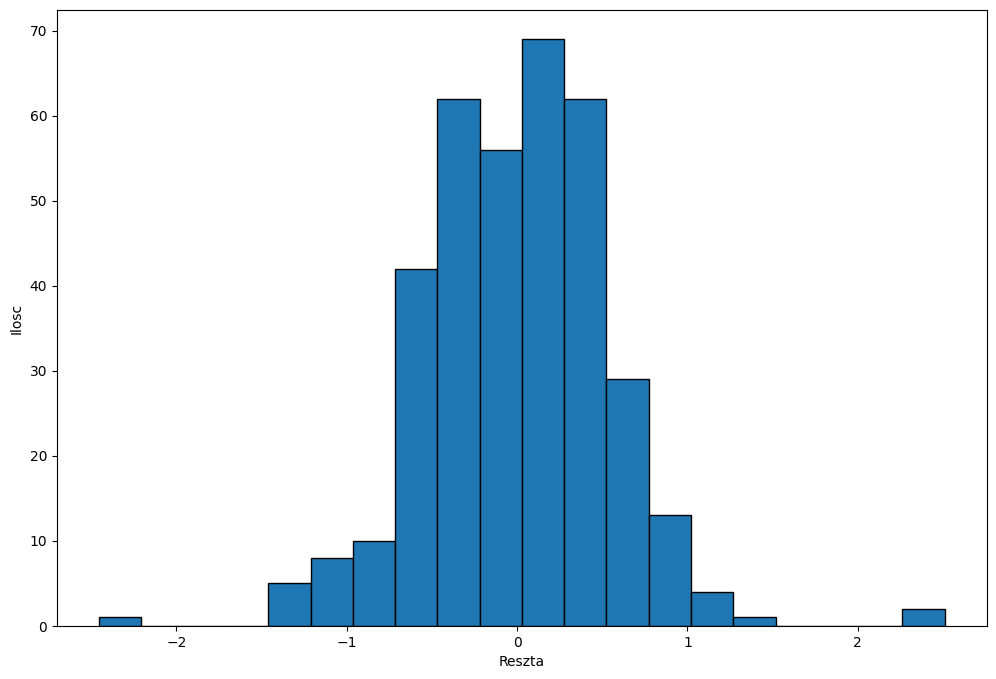

In [199]:
plt.hist(m6.resid, bins = 20, edgecolor = 'black')
plt.xlabel("Reszta")
plt.ylabel("Ilosc")
#plt.savefig('rozklad_n.jpg')
plt.show()

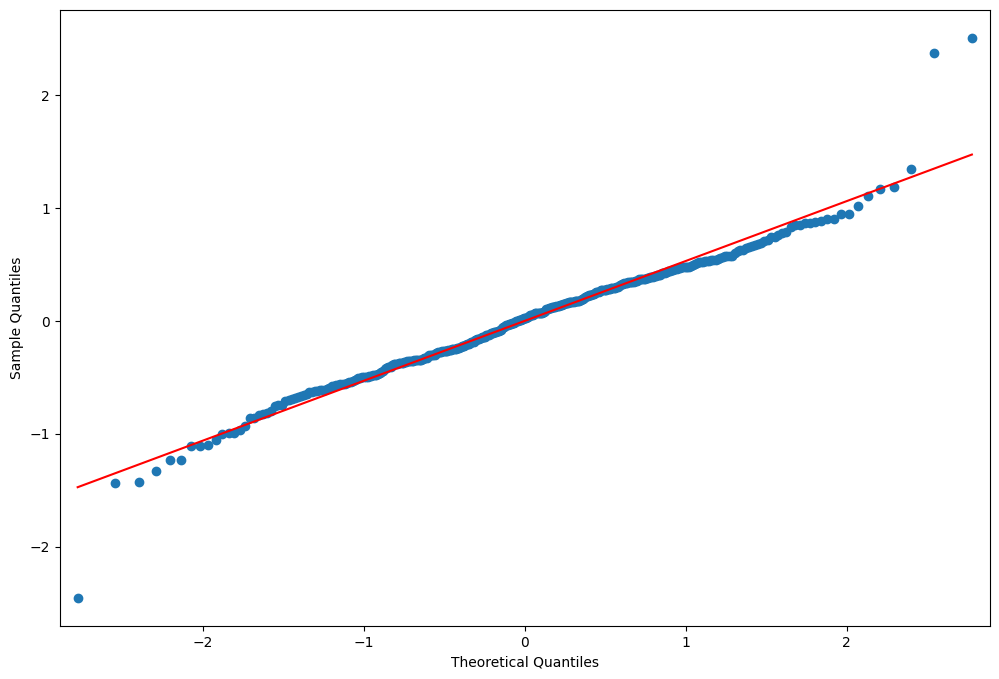

In [156]:
sm.qqplot(m6.resid, line = 'r')
plt.show()

In [157]:
test_jb = sms.jarque_bera(m6.resid)
test_jb

(110.60707715066923,
 9.593528432302983e-25,
 0.09947214848280575,
 5.693175724740478)

In [158]:
name_jb = ['The Jarque-Bera test statistic', 'p-value', 'skewness', 'kurtosis']

In [159]:
lzip(name_jb, test_jb)

[('The Jarque-Bera test statistic', 110.60707715066923),
 ('p-value', 9.593528432302983e-25),
 ('skewness', 0.09947214848280575),
 ('kurtosis', 5.693175724740478)]

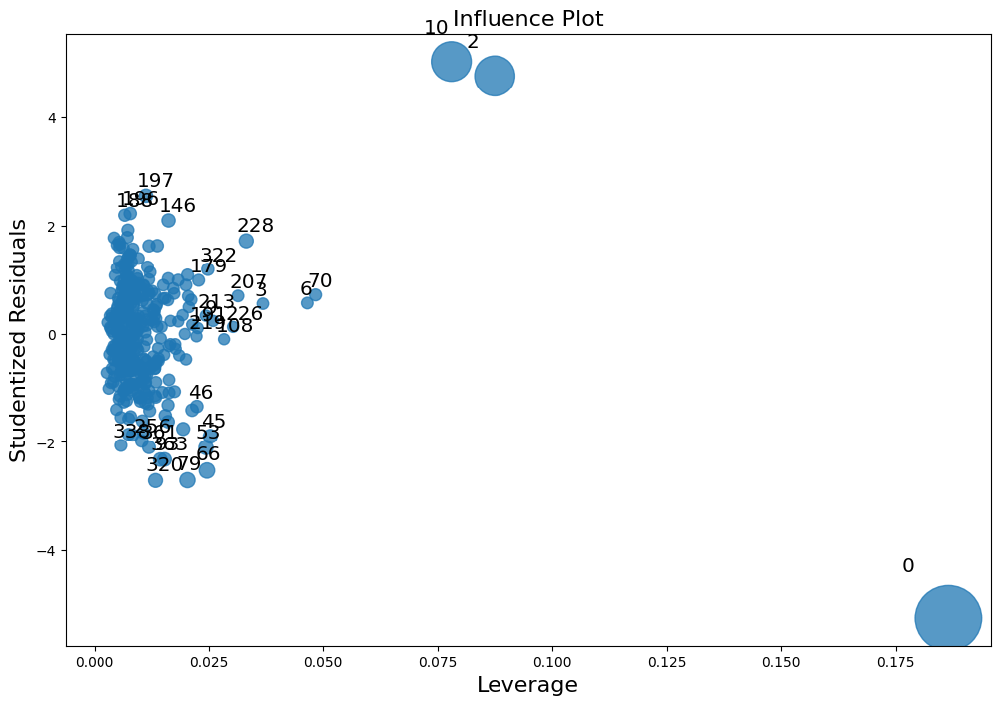

In [160]:
sm.graphics.influence_plot(m6, criterion = 'Cooks')
plt.show()

In [161]:
h_lev = (2*len(m6.params))/m6.nobs
round(h_lev, 2)

0.02

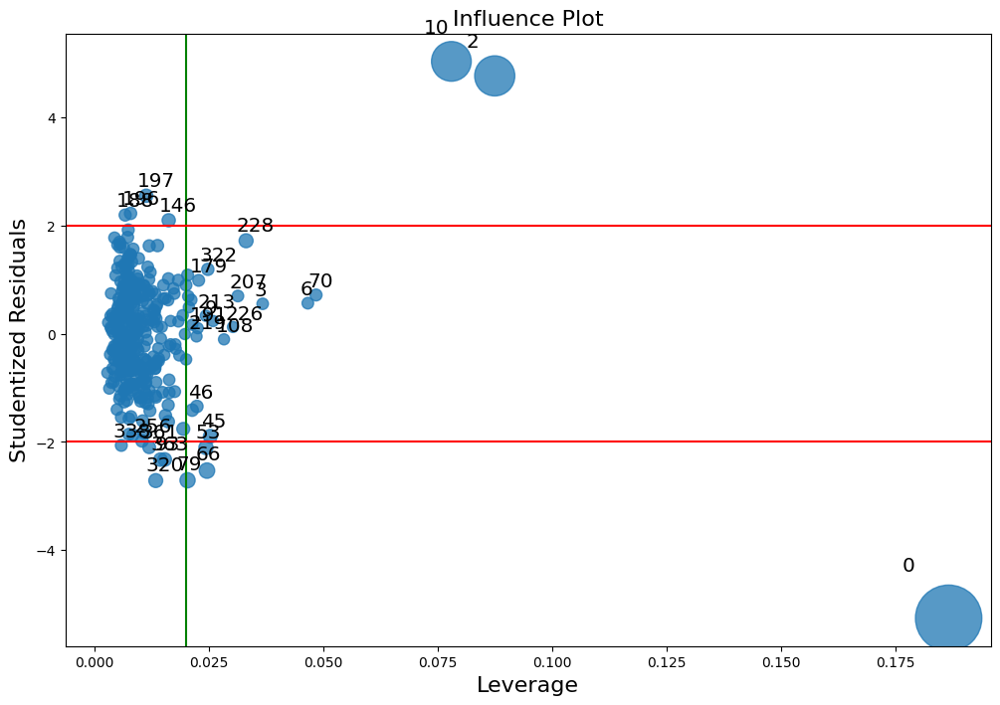

In [162]:
sm.graphics.influence_plot(m6, criterion = 'Cooks')
plt.axvline(x = round(h_lev, 2), color = 'g')
plt.axhline(y = 2, color = 'r')
plt.axhline(y = -2, color = 'r')
plt.show()

In [163]:
cooks = m6.get_influence().cooks_distance

In [164]:
df_base_filtered2['cooks'] = m6.get_influence().cooks_distance[0]

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\622831514.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered2['cooks'] = m6.get_influence().cooks_distance[0]


In [165]:
df_base_filtered2

,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,...,views,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020,residuals2,residuals,predictions,cooks
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,...,23531.0,54.0,0.561,41118.0,27.66,False,6.019383,-2.453443,12.519517,1.478338
1,391.0,2016-06-10,Friday,861.0,1.172,35.0,5.0,18.0,322.0,1.0,...,11478.0,34.0,0.648,41627.0,5.85,False,0.000155,0.012456,9.335732,0.000002
2,133.0,2016-06-14,Tuesday,88.0,0.160,1.0,4.0,20.0,239.0,0.0,...,6153.0,8.0,0.089,38713.0,7.07,False,5.624854,2.371678,6.353018,0.514100
3,14.0,2016-06-29,Wednesday,35.0,0.030,12.0,7.0,14.0,220.0,0.0,...,4398.0,2.0,0.017,35245.0,5.60,False,0.085232,0.291945,8.096960,0.002936
4,45.0,2016-07-01,Friday,0.0,0.000,50.0,7.0,180.0,602.0,3.0,...,14659.0,31.0,1.000,46218.0,8.62,False,0.146190,-0.382348,9.975158,0.001386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,779.0,2024-08-25,Sunday,5877.0,14.199,54.0,44.0,6.0,749.0,6.0,...,10018.0,22.0,8.063,97065.0,8.23,True,0.942088,-0.970612,10.182751,0.009018
360,818.0,2024-09-01,Sunday,5500.0,15.413,28.0,26.0,6.0,587.0,6.0,...,8298.0,13.0,8.705,65912.0,9.36,True,0.558799,-0.747529,9.771298,0.010817
361,2233.0,2024-09-16,Monday,6237.0,17.136,51.0,30.0,13.0,707.0,3.0,...,8487.0,17.0,9.852,76517.0,8.28,True,1.238041,-1.112673,10.158964,0.013145
362,391.0,2024-09-25,Wednesday,2797.0,6.773,31.0,21.0,4.0,483.0,6.0,...,7060.0,17.0,3.858,67091.0,8.29,True,0.643642,-0.802273,9.664473,0.008938


In [166]:
df_base_filtered2['index_column'] = df_base_filtered2.index

C:\Users\Łukasz\AppData\Local\Temp\ipykernel_13208\4224961544.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_base_filtered2['index_column'] = df_base_filtered2.index


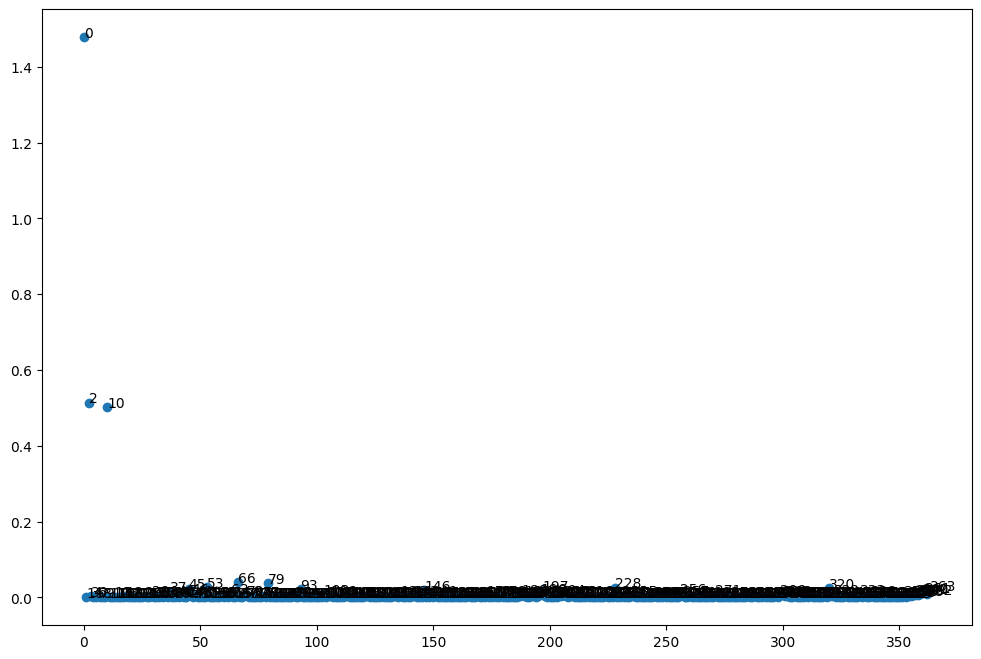

In [167]:
plt.scatter(df_base_filtered2['index_column'], df_base_filtered2['cooks'])
for idx, row in df_base_filtered2.iterrows():
    plt.annotate(row['index_column'], (row['index_column'], row['cooks']))

In [168]:
mean_cooks = df_base_filtered2['cooks'].mean()

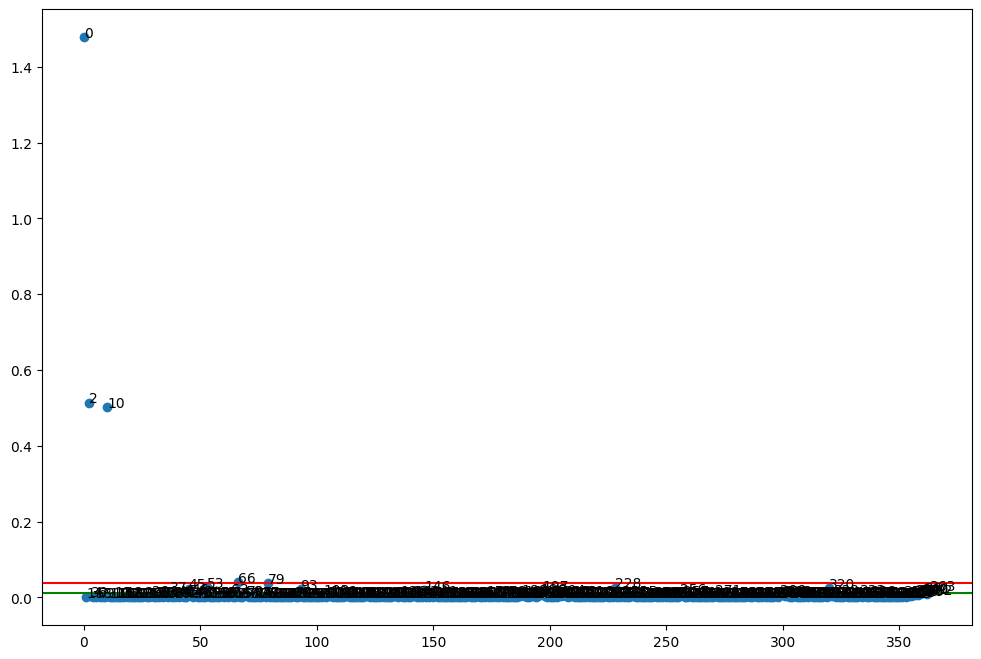

In [169]:
plt.scatter(df_base_filtered2['index_column'], df_base_filtered2['cooks'])
plt.axhline(y = 4/m6.nobs, color = 'g')
plt.axhline(y = 4*mean_cooks, color = 'r')
for idx, row in df_base_filtered2.iterrows():
    plt.annotate(row['index_column'], (row['index_column'], row['cooks']))

In [170]:
df_base_filtered2[df_base_filtered2['cooks']>4*mean_cooks]

,video_duration,video_publish_time,week_day,ad_impressions,ads_revenue,comments,shares,dislikes,likes,unsubscribes,...,new_subscribers,estimated_revenue,impressions,vid_thumbnail_ctr_percent,past2020,residuals2,residuals,predictions,cooks,index_column
0,201.0,2016-06-02,Thursday,981.0,1.002,91.0,12.0,30.0,924.0,3.0,...,54.0,0.561,41118.0,27.66,False,6.019383,-2.453443,12.519517,1.478338,0
2,133.0,2016-06-14,Tuesday,88.0,0.160,1.0,4.0,20.0,239.0,0.0,...,8.0,0.089,38713.0,7.07,False,5.624854,2.371678,6.353018,0.514100,2
10,29.0,2016-08-17,Wednesday,277.0,0.418,1.0,11.0,17.0,255.0,2.0,...,13.0,0.231,37207.0,5.13,False,6.296914,2.509365,6.224390,0.502627,10
66,79.0,2017-03-24,Friday,1056.0,0.239,131.0,25.0,60.0,425.0,5.0,...,8.0,0.131,42724.0,0.96,False,1.767903,-1.329625,9.744121,0.039691,66
79,128.0,2017-05-01,Monday,61.0,0.384,122.0,9.0,4.0,440.0,0.0,...,2.0,0.212,51568.0,1.43,False,2.029629,-1.424651,9.780266,0.037354,79


In [171]:
df_base_filtered2_check = df_base_filtered2.drop(df_base_filtered2.index[0], axis = 0)

In [172]:
m6_check = smf.ols(formula = "np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data = df_base_filtered2_check).fit(cov_type = "HC0")
m6_check.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(views)   R-squared:                       0.828
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     324.0
Date:                Mon, 09 Feb 2026   Prob (F-statistic):          9.21e-102
Time:                        17:21:58   Log-Likelihood:                -273.66
No. Observations:                 363   AIC:                             555.3
Df Residuals:                     359   BIC:                             570.9
Df Model:                           3                                         
Covariance Type:                  HC0                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     5.7868      0.252     22.919      0.000       5.292       6.282
np.log(comments)              0.7918      0.059     13.517      0.000       0.677       0.907
np.log(estimated_revenue)     0.0829      0.014      5.970      0.000       0.056       0.110
vid_thumbnail_ctr_percent     0.1364      0.015      8.914      0.000       0.106       0.166
==============================================================================
Omnibus:                       22.199   Durbin-Watson:                   1.301
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.333
Skew:                           0.362   Prob(JB):                     1.06e-09
Kurtosis:                       4.486   Cond. No.                         52.5
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [173]:
Stargazer([m6, m6_check])

In [174]:
y, X = pt.dmatrices("np.log(views) ~ np.log(comments) + np.log(estimated_revenue) + vid_thumbnail_ctr_percent", data=df_base_filtered2, return_type='dataframe')

In [175]:
K = X.shape[1]
VIF = np.empty(K)

In [176]:
for i in range(K):
    VIF[i] = smo.variance_inflation_factor(X.values, i)

In [177]:
VIF

array([26.96727189,  1.27965731,  1.06279443,  1.25951047])

In [178]:
m6.params.index

Index(['Intercept', 'np.log(comments)', 'np.log(estimated_revenue)',
       'vid_thumbnail_ctr_percent'],
      dtype='object')

In [179]:
zmienne = ['Intercept', 'np.log(comments)', 'np.log(estimated_revenue)', 'vid_thumbnail_ctr_percent']

In [180]:
result = pd.DataFrame({
    'zmienna': zmienne,
    'VIF': VIF
    }
)

In [181]:
result

,zmienna,VIF
0,Intercept,26.967272
1,np.log(comments),1.279657
2,np.log(estimated_revenue),1.062794
3,vid_thumbnail_ctr_percent,1.259510


# Dodatkowe wykresy, tabele do raportu

In [182]:
zmienne = ["Intercept", "np.log(comments)", "np.log(estimated_revenue)", "np.log(video_duration)", "vid_thumbnail_ctr_percent", "C(past2020)[T.True]", "C(week_day, Treatment(reference='Sunday'))[T.Monday]", "C(week_day, Treatment(reference='Sunday'))[T.Tuesday]", "C(week_day, Treatment(reference='Sunday'))[T.Wednesday]", "C(week_day, Treatment(reference='Sunday'))[T.Thursday]", "C(week_day, Treatment(reference='Sunday'))[T.Friday]", "C(week_day, Treatment(reference='Sunday'))[T.Saturday]"]
tabela = Stargazer([m1, m2, m3, m4])
tabela.covariate_order(zmienne)
tabela

In [183]:
tabela.show_degrees_of_freedom(False)
tabela

In [184]:
tabela.render_html()

'<table style="text-align:center"><tr><td colspan="5" style="border-bottom: 1px solid black"></td></tr>\n<tr><td style="text-align:left"></td><td colspan="4"><em>Dependent variable: np.log(views)</em></td></tr><tr><td style="text-align:left"></td><tr><td style="text-align:left"></td><td>(1)</td><td>(2)</td><td>(3)</td><td>(4)</td></tr>\n<tr><td colspan="5" style="border-bottom: 1px solid black"></td></tr>\n\n<tr><td style="text-align:left">Intercept</td><td>5.946<sup>***</sup></td><td>5.928<sup>***</sup></td><td>5.871<sup>***</sup></td><td>5.790<sup>***</sup></td></tr>\n<tr><td style="text-align:left"></td><td>(0.279)</td><td>(0.267)</td><td>(0.161)</td><td>(0.146)</td></tr>\n<tr><td style="text-align:left">np.log(comments)</td><td>0.818<sup>***</sup></td><td>0.815<sup>***</sup></td><td>0.812<sup>***</sup></td><td>0.827<sup>***</sup></td></tr>\n<tr><td style="text-align:left"></td><td>(0.035)</td><td>(0.034)</td><td>(0.032)</td><td>(0.030)</td></tr>\n<tr><td style="text-align:left">np.

In [185]:
raport_columns = [
    "Video Duration",
    "New Comments",
    "Shares",
    "Dislikes",
    "Likes",
    "Views",
    "Estimated Revenue (USD)",
    "Video Thumbnail CTR (%)"
]

In [186]:
raport_column_names = [
    "video_duration",
    "comments",
    "shares",
    "dislikes",
    "likes",
    "views",
    "estimated_revenue",
    "vid_thumbnail_ctr_percent"
]

In [187]:
df_raport = df_base[raport_columns]

df_raport.columns = raport_column_names

tabela_stat = df_raport.describe(percentiles=[])

In [188]:
tabela_stat

,video_duration,comments,shares,dislikes,likes,views,estimated_revenue,vid_thumbnail_ctr_percent
count,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000
mean,664.239011,333.846154,252.958791,123.961538,5526.733516,128800.101648,8.852052,7.914615
std,330.646183,291.934648,363.016405,128.311620,4465.210998,118209.844270,13.414650,2.903383
min,9.000000,0.000000,1.000000,2.000000,121.000000,2461.000000,0.000000,0.620000
50%,613.000000,262.500000,149.000000,85.500000,5172.000000,101950.500000,4.285000,8.395000
max,2311.000000,2510.000000,4190.000000,818.000000,27222.000000,670990.000000,103.117000,27.660000


In [189]:
tabela_stat.to_html()

'<table border="1" class="dataframe">\n  <thead>\n    <tr style="text-align: right;">\n      <th></th>\n      <th>video_duration</th>\n      <th>comments</th>\n      <th>shares</th>\n      <th>dislikes</th>\n      <th>likes</th>\n      <th>views</th>\n      <th>estimated_revenue</th>\n      <th>vid_thumbnail_ctr_percent</th>\n    </tr>\n  </thead>\n  <tbody>\n    <tr>\n      <th>count</th>\n      <td>364.000000</td>\n      <td>364.000000</td>\n      <td>364.000000</td>\n      <td>364.000000</td>\n      <td>364.000000</td>\n      <td>364.000000</td>\n      <td>364.000000</td>\n      <td>364.000000</td>\n    </tr>\n    <tr>\n      <th>mean</th>\n      <td>664.239011</td>\n      <td>333.846154</td>\n      <td>252.958791</td>\n      <td>123.961538</td>\n      <td>5526.733516</td>\n      <td>128800.101648</td>\n      <td>8.852052</td>\n      <td>7.914615</td>\n    </tr>\n    <tr>\n      <th>std</th>\n      <td>330.646183</td>\n      <td>291.934648</td>\n      <td>363.016405</td>\n      <td>

In [190]:
tabela2 = Stargazer([m4, m6])
tabela2

In [191]:
tabela2.show_degrees_of_freedom(False)

In [192]:
tabela2.render_html()

'<table style="text-align:center"><tr><td colspan="3" style="border-bottom: 1px solid black"></td></tr>\n<tr><td style="text-align:left"></td><td colspan="2"><em>Dependent variable: np.log(views)</em></td></tr><tr><td style="text-align:left"></td><tr><td style="text-align:left"></td><td>(1)</td><td>(2)</td></tr>\n<tr><td colspan="3" style="border-bottom: 1px solid black"></td></tr>\n\n<tr><td style="text-align:left">Intercept</td><td>5.790<sup>***</sup></td><td>5.790<sup>***</sup></td></tr>\n<tr><td style="text-align:left"></td><td>(0.146)</td><td>(0.266)</td></tr>\n<tr><td style="text-align:left">np.log(comments)</td><td>0.827<sup>***</sup></td><td>0.827<sup>***</sup></td></tr>\n<tr><td style="text-align:left"></td><td>(0.030)</td><td>(0.065)</td></tr>\n<tr><td style="text-align:left">np.log(estimated_revenue)</td><td>0.090<sup>***</sup></td><td>0.090<sup>***</sup></td></tr>\n<tr><td style="text-align:left"></td><td>(0.015)</td><td>(0.015)</td></tr>\n<tr><td style="text-align:left">vi

In [193]:
model_poly_s = model_poly_1.summary()

In [194]:
model_poly_s.as_html()

'<table class="simpletable">\n<caption>OLS Regression Results</caption>\n<tr>\n  <th>Dep. Variable:</th>          <td>views</td>      <th>  R-squared:         </th> <td>   0.897</td> \n</tr>\n<tr>\n  <th>Model:</th>                   <td>OLS</td>       <th>  Adj. R-squared:    </th> <td>   0.891</td> \n</tr>\n<tr>\n  <th>Method:</th>             <td>Least Squares</td>  <th>  F-statistic:       </th> <td>   157.5</td> \n</tr>\n<tr>\n  <th>Date:</th>             <td>Mon, 09 Feb 2026</td> <th>  Prob (F-statistic):</th> <td>8.02e-157</td>\n</tr>\n<tr>\n  <th>Time:</th>                 <td>17:21:58</td>     <th>  Log-Likelihood:    </th> <td> -181.04</td> \n</tr>\n<tr>\n  <th>No. Observations:</th>      <td>   364</td>      <th>  AIC:               </th> <td>   402.1</td> \n</tr>\n<tr>\n  <th>Df Residuals:</th>          <td>   344</td>      <th>  BIC:               </th> <td>   480.0</td> \n</tr>\n<tr>\n  <th>Df Model:</th>              <td>    19</td>      <th>                     </th>   